# **Project Title**
# Predicting Diabetes Likelihood and Classifying Diabetes Types Using Demographic and Clinical Data: A Hybrid Machine Learning Approach

### **0. Background & Motivation**
* Diabetes is a chronic, progressive condition that affects millions worldwide, leading to severe health complications such as cardiovascular disease, kidney failure, neuropathy, and vision problems. The burden of diabetes is growing globally, with pre-diabetes and undiagnosed cases rising. Early detection and intervention are critical to reducing diabetes-related complications and healthcare costs.

* This project leverages machine learning to predict the likelihood of diabetes and classify individuals into relevant categories (e.g., pre-diabetes, Type 1, Type 2).
* A flexible, data-driven approach will help healthcare professionals identify high-risk individuals and tailor interventions effectively.
* The goal is to provide both probabilistic risk scores and binary classifications, allowing clinicians to make more informed decisions.

### **1. Objective**
* The primary objective is to develop a machine learning model that predicts the likelihood of diabetes and classifies individuals into diabetes categories based on demographic and clinical data. The secondary objective is to ensure the model's interpretability for clinical use to improve patient outcomes.

### **Project Phases**
#### **Phase 1: Data Cleaning & Analysis (Week 1)**
* Tasks:

* Review and clean the dataset (handle missing values, inconsistencies, outliers).
Perform exploratory data analysis (EDA) to identify trends, correlations, and key factors influencing diabetes.
Univariate, bivariate, and multivariate analysis to explore the relationships between features and the diabetes outcome.

###### **Milestone:**

***Cleaned dataset and comprehensive EDA report, including feature insights and correlations.***

# Upload Data to Google Colab
**1: Upload the Dataset from Local**
* To upload a dataset directly from your local machine, follow these steps:
   * Open Google Colab in your browser.
   * Start a new notebook.
   * Use the following code to upload the CSV file:

In [1]:
from google.colab import files
uploaded = files.upload()


Saving diabetes.csv to diabetes.csv


In [2]:
# System and OS libraries
import os
import warnings

# Ignore warnings for clean output
warnings.filterwarnings("ignore")

# Data analysis libraries
import pandas as pd
import numpy as np

# Data visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Machine learning libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import GridSearchCV

# Set visualization settings
sns.set(style="whitegrid")
plt.style.use('fivethirtyeight')

# Colab specific imports (for file uploads)
# from google.colab import files

# Now we can proceed to load the dataset


## Explanation of Libraries:
#### OS & Warnings:

* os: For interacting with the file system (if needed).
* warnings: To suppress unnecessary warnings for cleaner output.
*Data Analysis:
  * pandas: For data manipulation and analysis.
  * numpy: For numerical operations and handling arrays.
*Data Visualization:
  * matplotlib.pyplot: For creating static visualizations.
  * seaborn: For making statistical data visualizations (based on matplotlib).
*Machine Learning:
  * sklearn.model_selection: For splitting the data and hyperparameter tuning.
  * sklearn.preprocessing: For scaling and encoding the data.
  * sklearn.ensemble: Random forest classifier for initial model testing.
  * sklearn.linear_model: Logistic regression for likelihood prediction.
  * sklearn.metrics: To evaluate the model’s performance using accuracy, precision, recall, F1-score, and ROC-AUC.
  In a machine learning project, sklearn.metrics provides a set of functions to evaluate model performance. Here's a breakdown of the key metrics it offers and how each is used:

1. Accuracy
Definition: Accuracy measures the percentage of correct predictions out of all predictions made. It’s commonly used in classification tasks where classes are balanced.
​

2. Precision
Definition: Precision measures the accuracy of positive predictions (i.e., how many predicted positives are actually positive). It’s especially useful when the cost of false positives is high.

3. Recall
Definition: Recall, or sensitivity, measures how well the model identifies positive instances (i.e., how many actual positives are correctly classified). It’s essential when the cost of false negatives is high.

4. F1-Score
Definition: The F1-score is the harmonic mean of precision and recall, offering a single measure to balance the two. It’s useful when there’s an uneven class distribution, and both false positives and false negatives matter.

5. ROC-AUC (Receiver Operating Characteristic - Area Under Curve)
Definition: The ROC-AUC score evaluates how well the model distinguishes between classes by plotting the true positive rate (sensitivity) against the false positive rate. A higher AUC indicates better performance at separating positive and negative instances.

*Colab Specific:
  * google.colab.files: To upload files from your local machine.

In [4]:
# Load the dataset into a pandas DataFrame
# Replace 'diabetes_dataset.csv' with the actual name of your file after uploading
df = pd.read_csv('diabetes.csv')

# Display the first few rows of the dataset
df.head()

,year,gender,age,location,race:AfricanAmerican,race:Asian,race:Caucasian,race:Hispanic,race:Other,hypertension,heart_disease,smoking_history,bmi,hbA1c_level,blood_glucose_level,diabetes
0,2020,Female,32.0,Alabama,0,0,0,0,1,0,0,never,27.32,5.0,100,0
1,2015,Female,29.0,Alabama,0,1,0,0,0,0,0,never,19.95,5.0,90,0
2,2015,Male,18.0,Alabama,0,0,0,0,1,0,0,never,23.76,4.8,160,0
3,2015,Male,41.0,Alabama,0,0,1,0,0,0,0,never,27.32,4.0,159,0
4,2016,Female,52.0,Alabama,1,0,0,0,0,0,0,never,23.75,6.5,90,0


**2. Inspect the Data**
* Once the dataset is loaded, it’s time to inspect it to understand its structure, identify any potential issues, and check for missing values or inconsistencies.

In [5]:
# Check the shape of the data
df.shape

(100000, 16)

In [6]:
# Check data types and basic structure
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 16 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   year                  100000 non-null  int64  
 1   gender                100000 non-null  object 
 2   age                   100000 non-null  float64
 3   location              100000 non-null  object 
 4   race:AfricanAmerican  100000 non-null  int64  
 5   race:Asian            100000 non-null  int64  
 6   race:Caucasian        100000 non-null  int64  
 7   race:Hispanic         100000 non-null  int64  
 8   race:Other            100000 non-null  int64  
 9   hypertension          100000 non-null  int64  
 10  heart_disease         100000 non-null  int64  
 11  smoking_history       100000 non-null  object 
 12  bmi                   100000 non-null  float64
 13  hbA1c_level           100000 non-null  float64
 14  blood_glucose_level   100000 non-null  int64  
 15  d

In [7]:
# Get summary statistics of numerical columns
df.describe()

,year,age,race:AfricanAmerican,race:Asian,race:Caucasian,race:Hispanic,race:Other,hypertension,heart_disease,bmi,hbA1c_level,blood_glucose_level,diabetes
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,2018.360820,41.885856,0.202230,0.200150,0.198760,0.19888,0.199980,0.07485,0.039420,27.320767,5.527507,138.058060,0.085000
std,1.345239,22.516840,0.401665,0.400114,0.399069,0.39916,0.399987,0.26315,0.194593,6.636783,1.070672,40.708136,0.278883
min,2015.000000,0.080000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,10.010000,3.500000,80.000000,0.000000
25%,2019.000000,24.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,23.630000,4.800000,100.000000,0.000000
50%,2019.000000,43.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,27.320000,5.800000,140.000000,0.000000
75%,2019.000000,60.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,29.580000,6.200000,159.000000,0.000000
max,2022.000000,80.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.00000,1.000000,95.690000,9.000000,300.000000,1.000000


**This output provides summary statistics for the dataset, allowing us to understand the distribution of each feature.**
1. General Information
  - Number of observations:
    - Each column has 100,000 entries (count = 100000), so the dataset is complete with no missing values.
2. Year
  - Mean year: The average year is 2018.36, meaning most data was collected around 2018-2019.
  - Range: The data spans from 2015 to 2022, which provides a recent and relevant dataset for predicting current diabetes trends.
3. Age
  - Mean age: The average age is 41.88 years, indicating the dataset includes a broad adult population.
  - Range: The minimum age is 0.08 years (likely representing infants), while the maximum age is 80 years.
  - Distribution: The quartiles (25%, 50%, 75%) show that 50% of the population is between 24 and 60 years old. The median age is 43.
4. Race Representation
  - The dataset has binary indicators (0 or 1) for each race category:
    - race columns are used to represent racial identity, with the value "1" indicating belonging to that race.
      - African American: 20.2% of the dataset (mean = 0.20223).
Asian: 20% (mean = 0.20015).
Caucasian: 19.8% (mean = 0.19876).
Hispanic: 19.9% (mean = 0.19888).
Other: 20% (mean = 0.19998).
This suggests a fairly balanced dataset across racial categories.

5. Hypertension
Mean: 7.48% of individuals have hypertension (mean = 0.07485).
Range: Values are binary (0 or 1), indicating whether a person has hypertension.
6. Heart Disease
Mean: 3.94% of individuals have heart disease (mean = 0.03942).
Range: This is also a binary variable (0 or 1).
7. BMI (Body Mass Index)
Mean BMI: The average BMI is 27.32, which falls in the "overweight" category (25–29.9).
Range: BMI ranges from 10.01 (underweight) to 95.69 (extremely high, suggesting a rare or incorrect entry).
Distribution: The majority of individuals have a BMI between 23.63 and 29.58, as indicated by the 25th and 75th percentiles.
8. HbA1c Level
Mean HbA1c: The average HbA1c level is 5.53%, which is close to the upper limit of normal (5.7%).
Range: Values range from 3.5% to 9%, with higher values indicating diabetes.
Distribution: The interquartile range (IQR) shows that 50% of the population has HbA1c levels between 4.8% and 6.2%. The median is 5.8%, indicating that some individuals are already in the pre-diabetes or diabetes range.
9. Blood Glucose Level
Mean blood glucose: The average blood glucose level is 138.06 mg/dL, which is above normal (typically 70-100 mg/dL), indicating that many individuals in the dataset may have diabetes or are at risk.
Range: Blood glucose levels range from 80 mg/dL to 300 mg/dL, with extreme values suggesting severe hyperglycemia or outliers.
Distribution: The median is 140 mg/dL, and the 75th percentile is 159 mg/dL, indicating that a significant portion of the dataset could be in the pre-diabetic or diabetic range.
10. Diabetes Status (Target Variable)
Mean: The mean value is 0.085, indicating that approximately 8.5% of individuals have been diagnosed with diabetes.
Range: This is a binary variable (0 or 1), with "1" representing individuals diagnosed with diabetes.
Key Insights:
Age: The dataset has a wide age range, with a median age of 43, which aligns well with a target population for diabetes risk assessment.
Race Representation: The dataset includes diverse racial groups, with each category representing approximately 20% of the population.
Health Conditions:
Hypertension (7.48%) and heart disease (3.94%) are present in a small subset of the population, but these comorbidities are critical for diabetes risk modeling.
BMI & HbA1c: Many individuals in the dataset are overweight or have elevated HbA1c, which suggests a high prevalence of pre-diabetes or diabetes.
Blood Glucose: A high average glucose level, along with elevated HbA1c levels, reinforces the likelihood of diabetes within this population.
Diabetes Diagnosis: 8.5% of the population has diabetes, providing a reasonable target size for the classification model.
These insights help us better understand the dataset, enabling us to focus on the most critical features (age, BMI, HbA1c, blood glucose, and comorbidities) for our diabetes risk prediction and classification tasks.

In [8]:
# Check for missing values
df.isnull().sum()

,0
year,0
gender,0
age,0
location,0
race:AfricanAmerican,0
race:Asian,0
race:Caucasian,0
race:Hispanic,0
race:Other,0
hypertension,0


In [9]:
# Check for duplicate rows in the dataset
duplicates = df.duplicated().sum()

# Print the number of duplicate rows
print(f"Number of duplicate rows: {duplicates}")

# If there are duplicates, you can drop them
if duplicates > 0:
    df = df.drop_duplicates()
    print(f"Duplicates removed. New dataset size: {df.shape}")
else:
    print("No duplicates found.")


Number of duplicate rows: 14
Duplicates removed. New dataset size: (99986, 16)


* Visualize the Distribution of Key Features
    * We’ll start by visualizing the distributions of important continuous features such as age, BMI, HbA1c levels, and blood glucose levels.

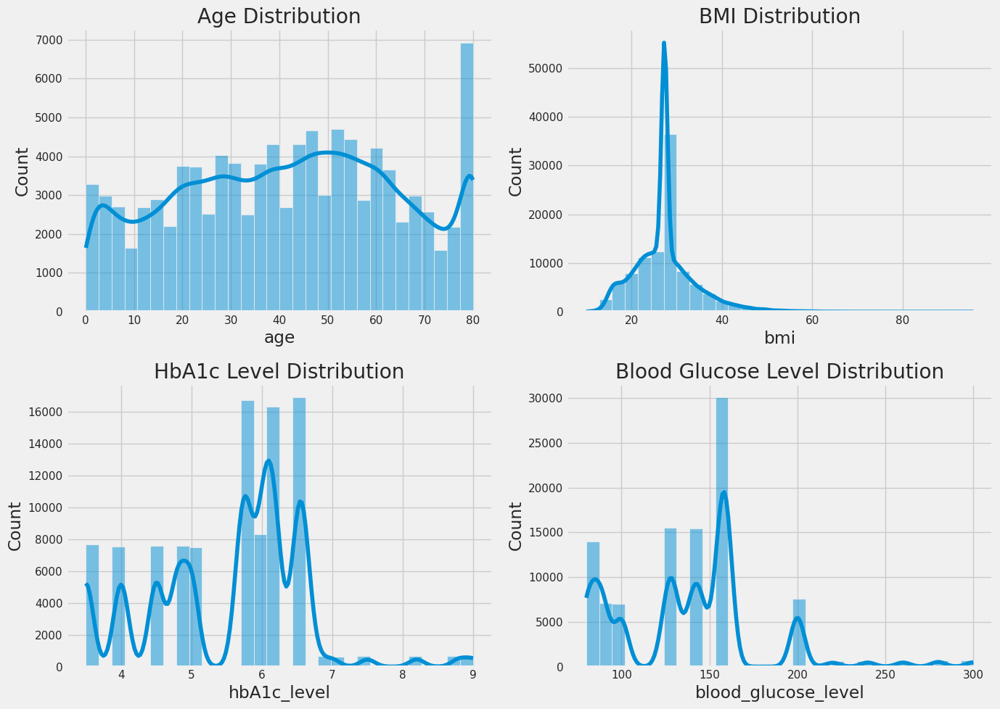

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the visualizations
plt.figure(figsize=(14, 10))

# Histogram of Age
plt.subplot(2, 2, 1)
sns.histplot(df['age'], kde=True, bins=30)
plt.title('Age Distribution')

# Histogram of BMI
plt.subplot(2, 2, 2)
sns.histplot(df['bmi'], kde=True, bins=30)
plt.title('BMI Distribution')

# Histogram of HbA1c Level
plt.subplot(2, 2, 3)
sns.histplot(df['hbA1c_level'], kde=True, bins=30)
plt.title('HbA1c Level Distribution')

# Histogram of Blood Glucose Level
plt.subplot(2, 2, 4)
sns.histplot(df['blood_glucose_level'], kde=True, bins=30)
plt.title('Blood Glucose Level Distribution')

plt.tight_layout()
plt.show()


* Correlation Analysis
    * We’ll explore how the features are correlated with one another, especially focusing on health-related features like BMI, HbA1c, and blood glucose levels.

Index(['year', 'age', 'race:AfricanAmerican', 'race:Asian', 'race:Caucasian',
       'race:Hispanic', 'race:Other', 'hypertension', 'heart_disease', 'bmi',
       'hbA1c_level', 'blood_glucose_level', 'diabetes'],
      dtype='object')


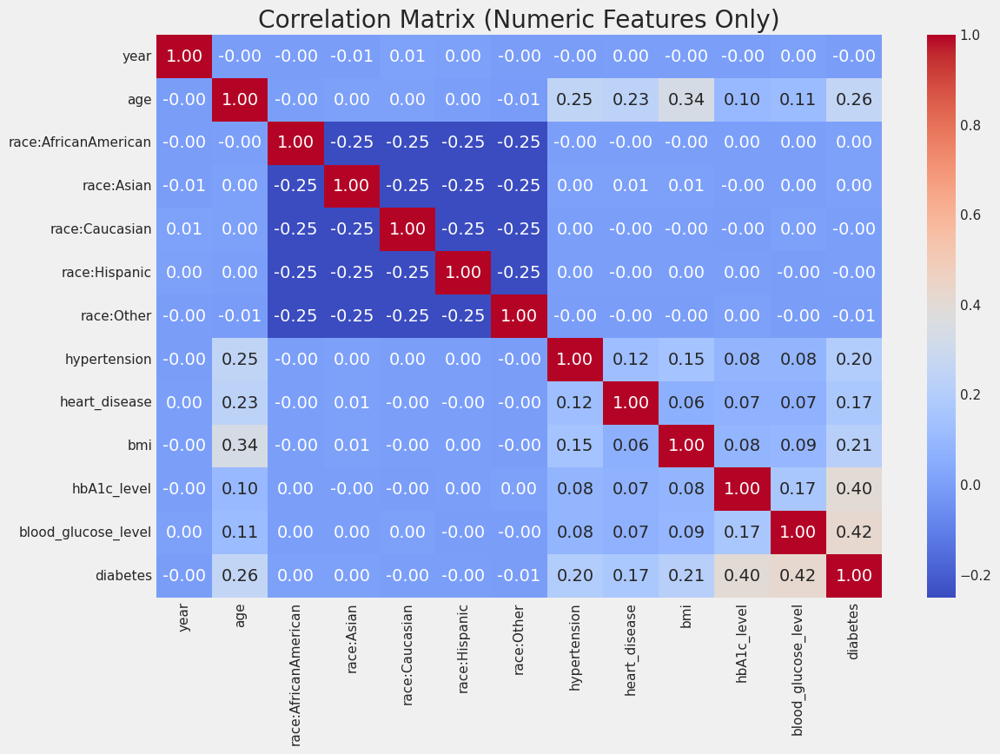

In [11]:
# Select only numeric columns from the DataFrame
numeric_cols = df.select_dtypes(include=[np.number])

# Check the selected numeric columns
print(numeric_cols.columns)

# Now, calculate the correlation matrix with the numeric columns
correlation_matrix = numeric_cols.corr()

# Plot the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix (Numeric Features Only)')
plt.show()


Relationships Between Demographics and Health Metrics
We can visualize how demographic factors (e.g., age, race) influence key health metrics and the likelihood of having diabetes.

Boxplots to Explore Demographic Groups
This will help identify differences in BMI, HbA1c, and blood glucose levels across age groups, gender, and race.

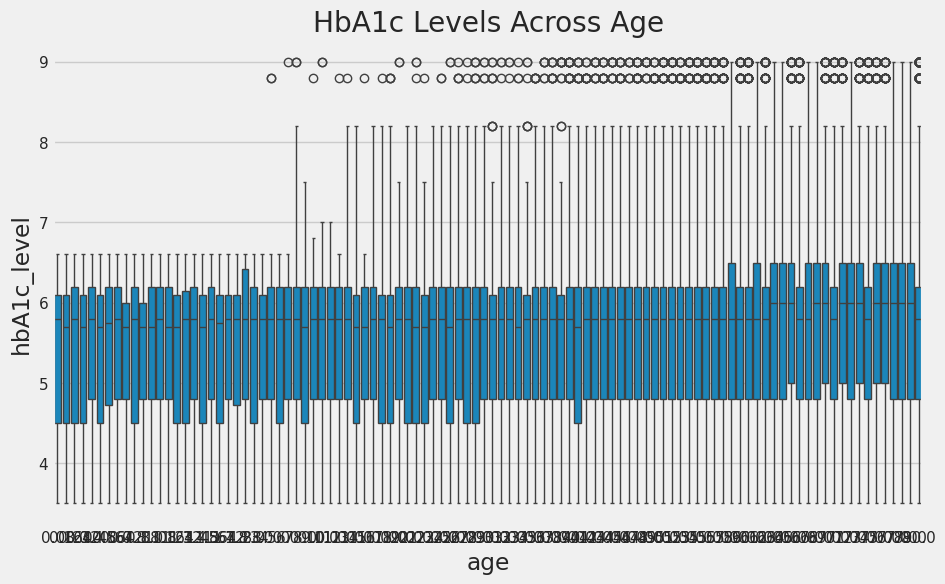

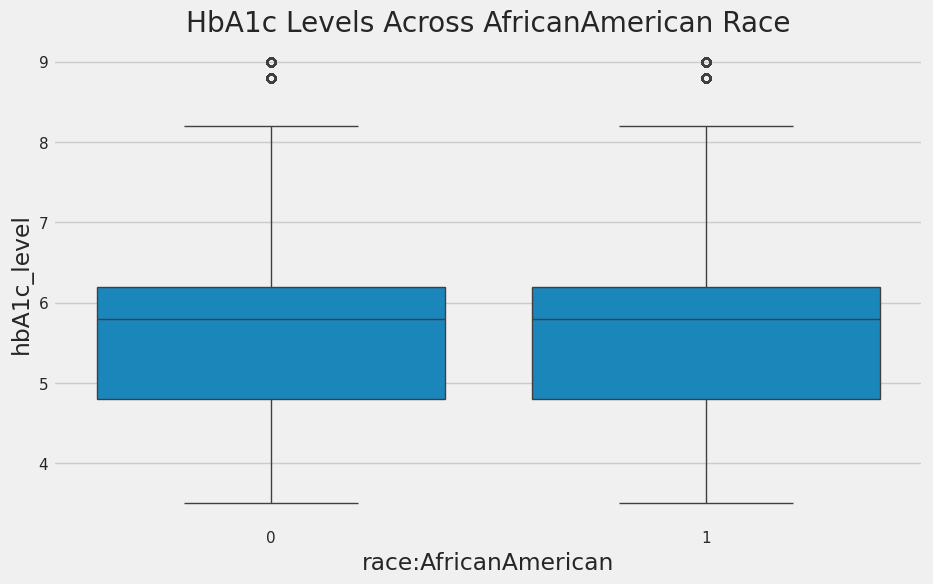

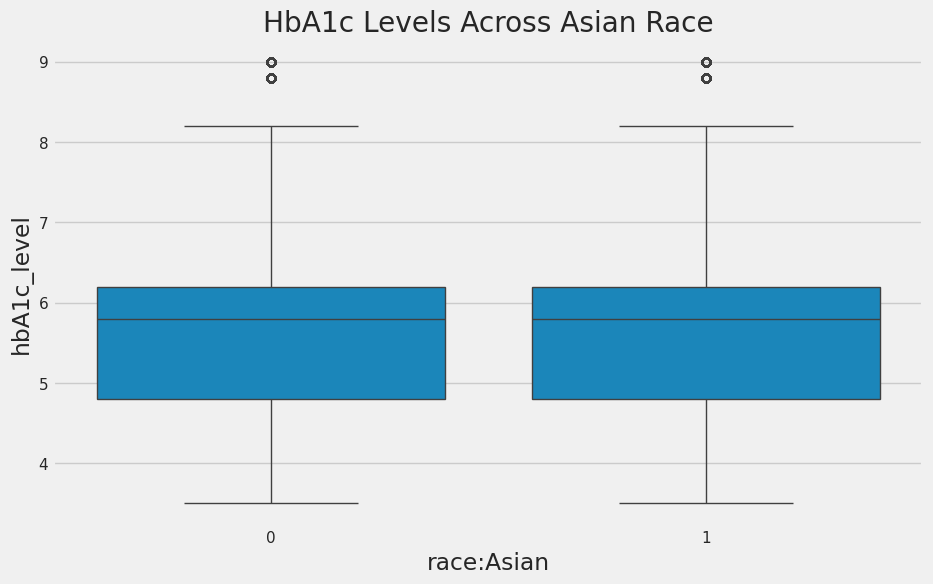

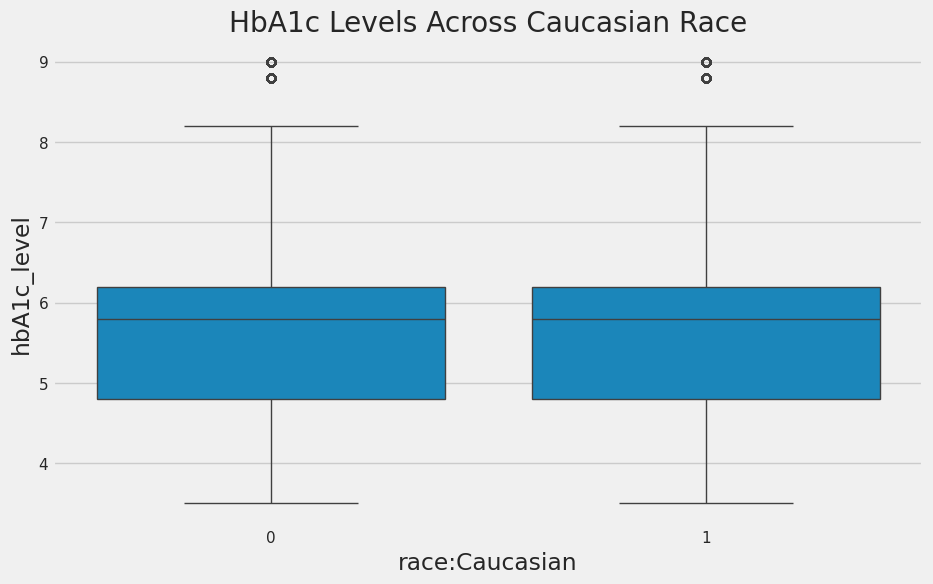

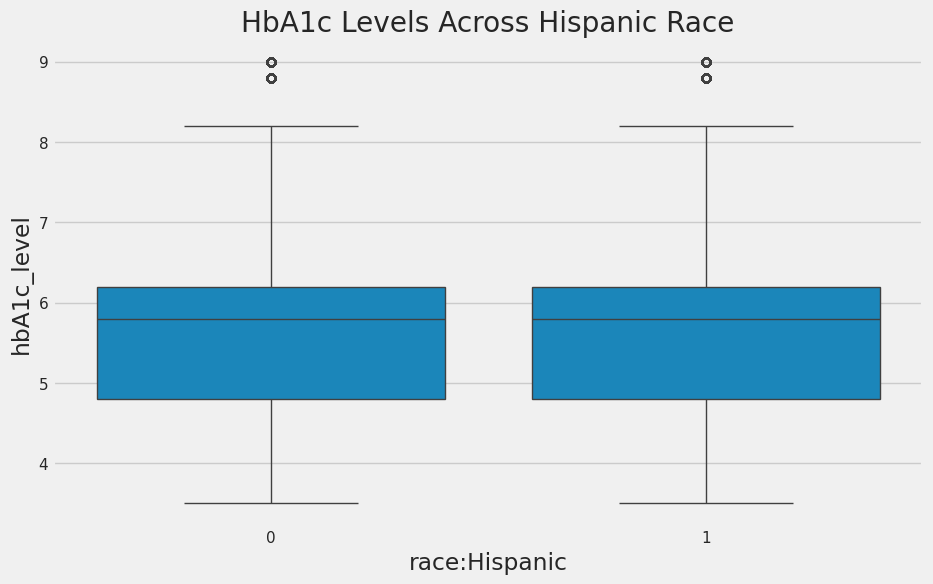

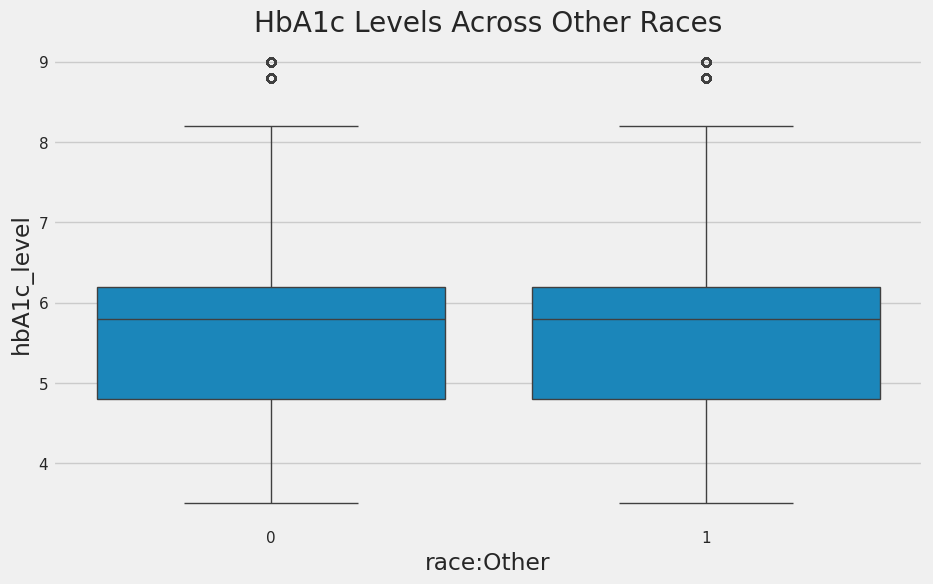

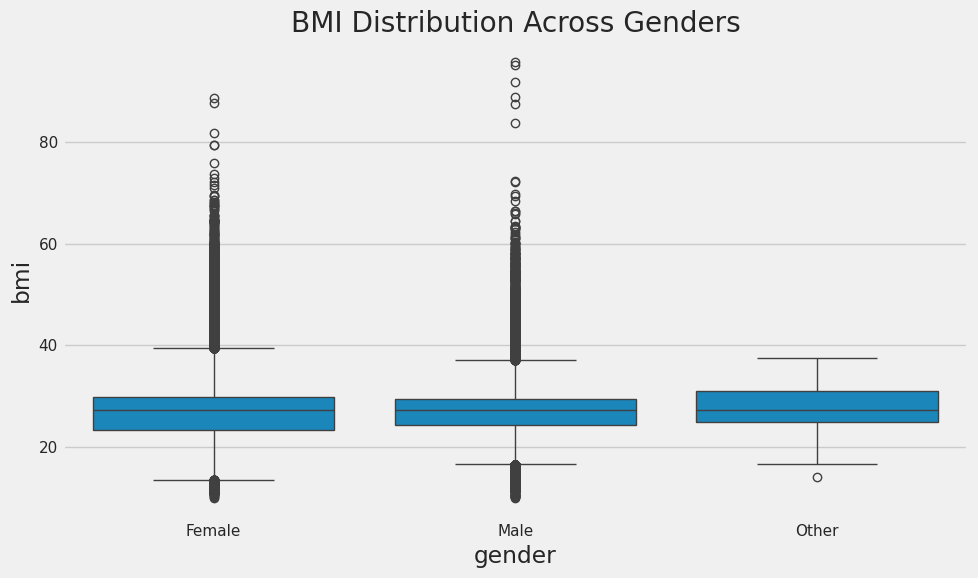

In [12]:
 # Age vs. HbA1c Level
plt.figure(figsize=(10, 6))
sns.boxplot(x='age', y='hbA1c_level', data=df)
plt.title('HbA1c Levels Across Age')

# Race vs. HbA1c Level
plt.figure(figsize=(10, 6))
sns.boxplot(x='race:AfricanAmerican', y='hbA1c_level', data=df)  # You can switch between race groups
plt.title('HbA1c Levels Across AfricanAmerican Race')

# Race vs. HbA1c Level
plt.figure(figsize=(10, 6))
sns.boxplot(x='race:Asian', y='hbA1c_level', data=df)  # You can switch between race groups
plt.title('HbA1c Levels Across Asian Race')

# Race vs. HbA1c Level
plt.figure(figsize=(10, 6))
sns.boxplot(x='race:Caucasian', y='hbA1c_level', data=df)  # You can switch between race groups
plt.title('HbA1c Levels Across Caucasian Race')

# Race vs. HbA1c Level
plt.figure(figsize=(10, 6))
sns.boxplot(x='race:Hispanic', y='hbA1c_level', data=df)  # You can switch between race groups
plt.title('HbA1c Levels Across Hispanic Race')

# Race vs. HbA1c Level
plt.figure(figsize=(10, 6))
sns.boxplot(x='race:Other', y='hbA1c_level', data=df)  # You can switch between race groups
plt.title('HbA1c Levels Across Other Races')

# Gender vs. BMI
plt.figure(figsize=(10, 6))
sns.boxplot(x='gender', y='bmi', data=df)
plt.title('BMI Distribution Across Genders')

plt.tight_layout()
plt.show()


Analysis of Target Variable (Diabetes Status)
Let’s also look at the distribution of the binary target variable to understand how many individuals are classified as having diabetes versus not.

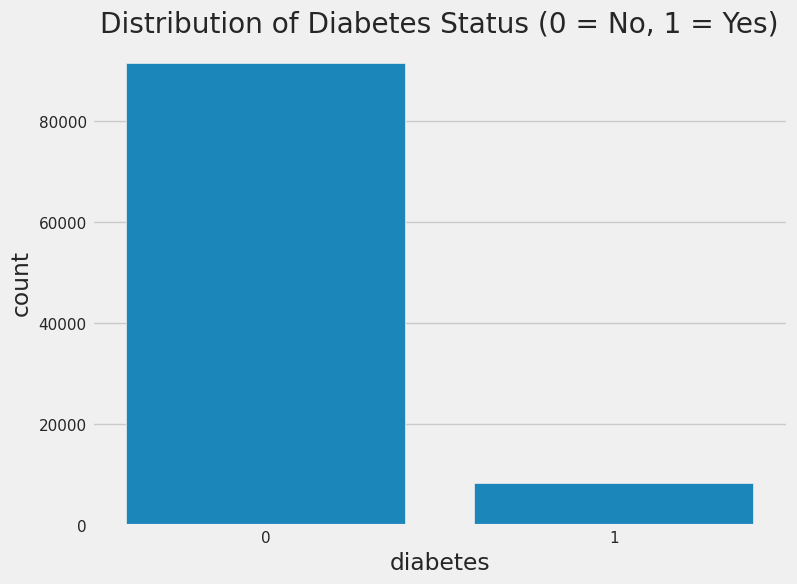

In [13]:
# Check the distribution of the target variable
df['diabetes'].value_counts()

# Plot the distribution
plt.figure(figsize=(8, 6))
sns.countplot(x='diabetes', data=df)
plt.title('Distribution of Diabetes Status (0 = No, 1 = Yes)')
plt.show()


The distribution of diabetes status in the dataset shows a significant class imbalance. Most of the individuals in the dataset fall into the non-diabetic (0) category, with a much smaller number in the diabetic (1) category. This type of class imbalance can cause challenges in training a model, particularly for the minority class (diabetic individuals).

Challenges of Class Imbalance:
Bias in Prediction: Models may become biased toward predicting the majority class (non-diabetic) and fail to effectively predict the minority class (diabetic), leading to poor performance on metrics like recall and precision for the diabetic class.
Evaluation Metrics: Standard accuracy may not be a reliable metric in this case, as a model could achieve high accuracy by simply predicting most individuals as non-diabetic (due to the class imbalance).
Techniques to Handle Class Imbalance:
1. Resampling the Dataset:
Oversampling the Minority Class: Increase the number of diabetic samples by duplicating existing diabetic cases or generating synthetic data (e.g., using SMOTE).
Undersampling the Majority Class: Reduce the number of non-diabetic samples to balance the classes, though this can result in loss of important data.
Example of using SMOTE (Synthetic Minority Over-sampling Technique)

2. Using Class Weighting in Models:
Most machine learning algorithms allow you to set class weights to penalize the model more for misclassifying the minority class. This helps the model focus more on learning patterns in the diabetic group.
For example, in Random Forest

3. Evaluation Metrics for Imbalanced Data:
Use metrics like F1-score, Precision-Recall AUC, and ROC-AUC to better evaluate how well the model is performing, especially on the minority class (diabetes).

##############################################

- Whether you should handle the class imbalance before or after modeling depends on the approach you want to take.

- Option 1: Handle Class Imbalance Before Modeling (Preprocessing Stage)
When to Choose: If you want to balance the dataset itself before feeding it into the model, you can use techniques like SMOTE (oversampling) or undersampling in the preprocessing step.
Benefits: This allows the model to learn from a balanced dataset right from the beginning. It helps in scenarios where you want a more even representation of each class (diabetic and non-diabetic) in the training process.
Pros:
Models are exposed to a balanced dataset during training.
You avoid overwhelming the model with too many non-diabetic cases, which can bias predictions.
Cons:
Overfitting: If you oversample the minority class (e.g., using SMOTE), the model might overfit to the generated or duplicated diabetic cases.
Data Loss: If you undersample the majority class, you may lose valuable information.
- Option 2: Handle Class Imbalance During Modeling
When to Choose: Most modern machine learning algorithms, such as Random Forest, XGBoost, and Logistic Regression, allow you to handle class imbalance within the model using the class weight parameter. This option enables the model to put more emphasis on misclassifying the minority class (diabetes).
Benefits: You avoid modifying the dataset itself and instead make the model focus more on learning patterns in the minority class.
Pros:
Avoids data loss or overfitting issues caused by oversampling or undersampling.
You retain the original distribution of the dataset.
Models can be easily configured to pay more attention to the minority class without changing the data.
Cons:
Class weighting can be a bit harder to tune for some models, and it might not always yield better performance.
When to Use Each Approach:
Preprocessing Approach (SMOTE or Undersampling):
Best for simpler models where the dataset needs to be more balanced before training.
Works well for small datasets or when you want to have balanced data throughout the entire process.
Class Weighting Approach (During Model Training):
Best for complex models (Random Forest, Gradient Boosting, Logistic Regression) that have built-in support for class weighting.
Recommended for larger datasets, where duplicating or removing data can result in performance degradation.
Recommendation:
Since you're in the early stages of modeling and have a significant class imbalance, I recommend starting with class weighting during the modeling stage, because:

It’s non-destructive: You don't alter the original data.
It’s easier to implement and tune: You can directly apply the weights to your chosen models without changing the dataset.
If class weighting doesn’t work well, you can always go back and apply oversampling or undersampling in the preprocessing step.


###########################################################


What’s the Problem?
Class imbalance means we have many more non-diabetic cases (0) than diabetic cases (1).
If we don’t address this, a model might predict most people as non-diabetic, because there are many more of them. This can lead to a high accuracy but poor performance when identifying the diabetic patients (which are fewer).
What Can We Do?
There are two ways to handle class imbalance:

Before modeling (Preprocessing): Modify the dataset so that the number of diabetic and non-diabetic cases is more balanced.

Oversampling: Add more diabetic cases by duplicating them or generating new ones (e.g., using SMOTE).
Undersampling: Remove some of the non-diabetic cases so both classes have similar numbers.
Pro: The dataset becomes balanced.
Con: Can lead to overfitting or loss of valuable data.

During modeling (Model training): Tell the model to pay more attention to the diabetic class without changing the data itself. We do this by using a parameter called class weights.

Class weights: The model will give more importance to diabetic cases to make sure it doesn’t ignore them just because there are fewer.
Pro: No data is removed or duplicated; we let the model handle the imbalance.
Con: Sometimes harder to fine-tune, but it's a safe first step.

What Did We Decide?
We suggested starting by using class weights in the model because:

It's simple and doesn't modify the data.
It allows the model to still learn from the original dataset but with a focus on the diabetic cases.
If it works well, you avoid the risk of overfitting or data loss that can come from modifying the dataset.
What Will Happen When We Use Class Weights?
The model will be more sensitive to diabetic cases.
It won’t just predict non-diabetic (0) because that’s the majority.
It will attempt to balance between non-diabetic and diabetic cases during training.

######################################


What We Are Doing:
We will train a Random Forest model (which supports class weights) on the original dataset.
We'll use class weights to make the model more sensitive to predicting diabetic cases, ensuring that it doesn't just predict the majority class (non-diabetic).
Step-by-Step Process:
Define Features and Target:

The features (X) are all the columns except for the target variable (diabetes).
The target (y) is the diabetes column, where 0 means no diabetes and 1 means diabetes.
Split the Data:

We'll split the data into a training set (to train the model) and a test set (to evaluate the model’s performance).
Train the Random Forest Model with Class Weights:

The class_weight='balanced' option in Random Forest will handle the class imbalance by automatically adjusting the weights for each class based on the class distribution.
Evaluate the Model:

After training the model, we’ll evaluate it using metrics like precision, recall, F1-score, and ROC-AUC to see how well it predicts both diabetic and non-diabetic cases.


In [14]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Step 1: One-hot encode the categorical variables
df_encoded = pd.get_dummies(df, drop_first=True)  # This encodes categorical columns into numerical format

# Step 2: Define the feature matrix (X) and the target vector (y)
X = df_encoded.drop('diabetes', axis=1)  # All columns except the target
y = df_encoded['diabetes']  # The target column (0 = no diabetes, 1 = diabetes)

# Step 3: Split the data into training and testing sets (70% training, 30% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Step 4: Initialize RandomForestClassifier with class weights
rf_model = RandomForestClassifier(class_weight='balanced', random_state=42)

# Step 5: Train the model on the training data
rf_model.fit(X_train, y_train)

# Step 6: Make predictions on the test data
y_pred = rf_model.predict(X_test)

# Step 7: Evaluate the model performance
print("Classification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99     27409
           1       0.99      0.69      0.81      2587

    accuracy                           0.97     29996
   macro avg       0.98      0.84      0.90     29996
weighted avg       0.97      0.97      0.97     29996



Steps to Visualize the Encoded Dataset:
Apply One-Hot Encoding.
Display a Sample of the Encoded Data using head() to see the transformed columns.
Optionally, you can use a heatmap to visualize correlations between the new features after encoding.

Encoded Dataset Sample:
   year   age  race:AfricanAmerican  race:Asian  race:Caucasian  \
0  2020  32.0                     0           0               0   
1  2015  29.0                     0           1               0   
2  2015  18.0                     0           0               0   
3  2015  41.0                     0           0               1   
4  2016  52.0                     1           0               0   

   race:Hispanic  race:Other  hypertension  heart_disease    bmi  ...  \
0              0           1             0              0  27.32  ...   
1              0           0             0              0  19.95  ...   
2              0           1             0              0  23.76  ...   
3              0           0             0              0  27.32  ...   
4              0           0             0              0  23.75  ...   

   location_Virginia  location_Washington  location_West Virginia  \
0              False                False                   False

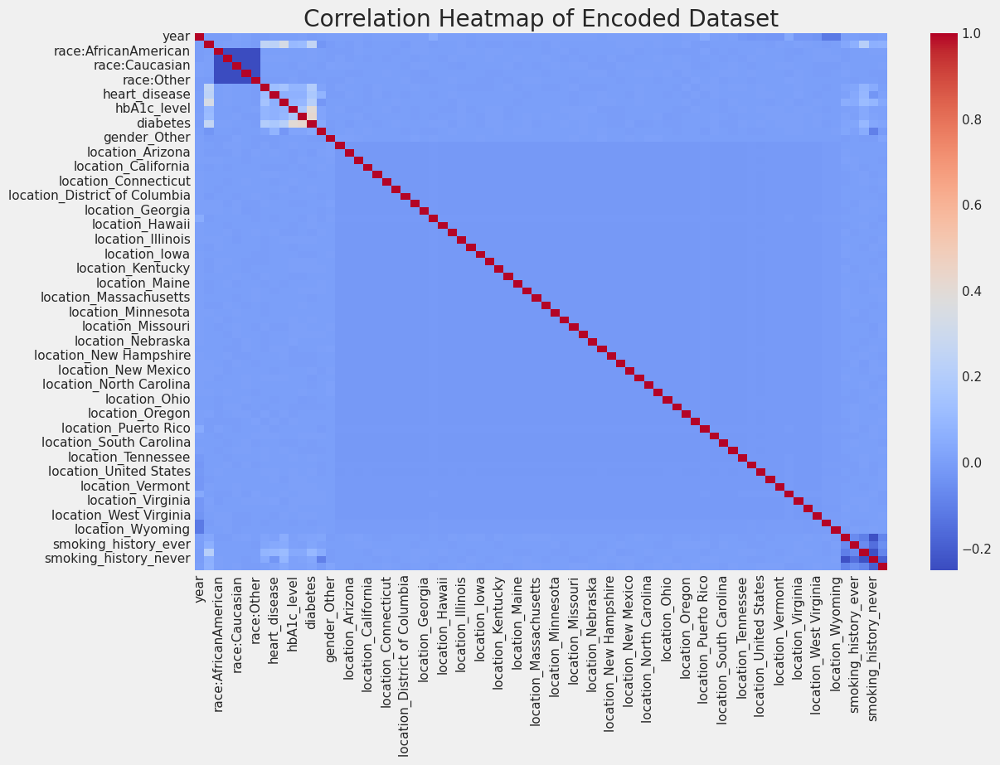

In [15]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Apply one-hot encoding
df_encoded = pd.get_dummies(df, drop_first=True)

# Step 2: Display the first few rows of the encoded dataset to see the changes
print("Encoded Dataset Sample:")
print(df_encoded.head())

# Step 3: Visualize correlations using a heatmap (optional)
plt.figure(figsize=(12, 8))
sns.heatmap(df_encoded.corr(), annot=False, cmap='coolwarm')
plt.title('Correlation Heatmap of Encoded Dataset')
plt.show()


How to Interpret a Correlation Heatmap:
Color Gradient: A gradient from one color (e.g., dark blue) to another (e.g., dark red) represents the strength of correlations. High positive correlations might be shown in dark blue, high negative correlations in dark red, and neutral correlations around zero in a lighter shade.
Values in Cells: Some heatmaps display numeric correlation values within each cell to provide precise correlation coefficients.
Overall, a correlation heatmap is a powerful tool for visualizing and interpreting complex relationships among variables in large datasets.

In [16]:
# Get the list of column headers in the DataFrame
column_headers = df.columns

# Print the column headers
print(column_headers)


Index(['year', 'gender', 'age', 'location', 'race:AfricanAmerican',
       'race:Asian', 'race:Caucasian', 'race:Hispanic', 'race:Other',
       'hypertension', 'heart_disease', 'smoking_history', 'bmi',
       'hbA1c_level', 'blood_glucose_level', 'diabetes'],
      dtype='object')


Automated Box Plots for Categorical vs Numeric Variables
You can loop through all the categorical variables and plot them against all the numeric variables in your dataset:

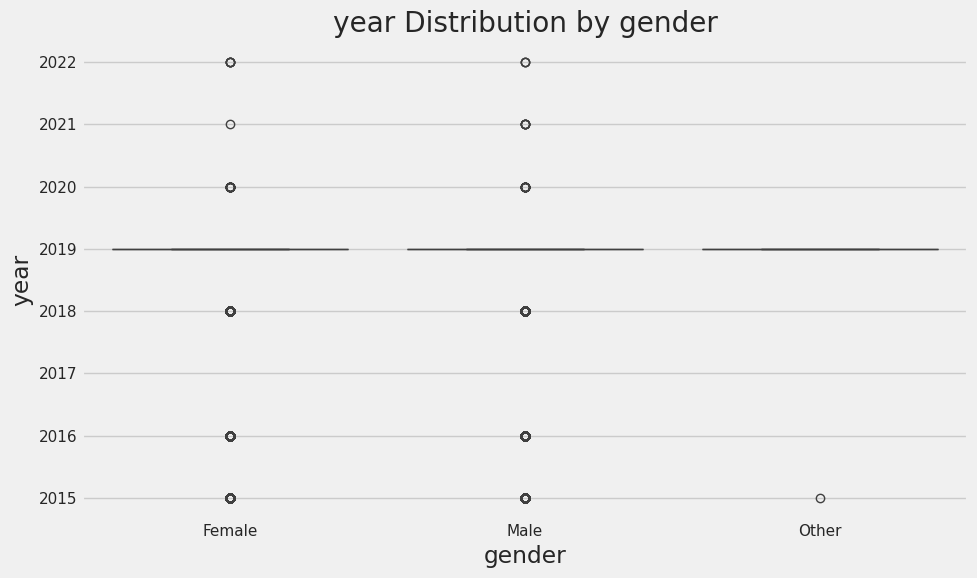

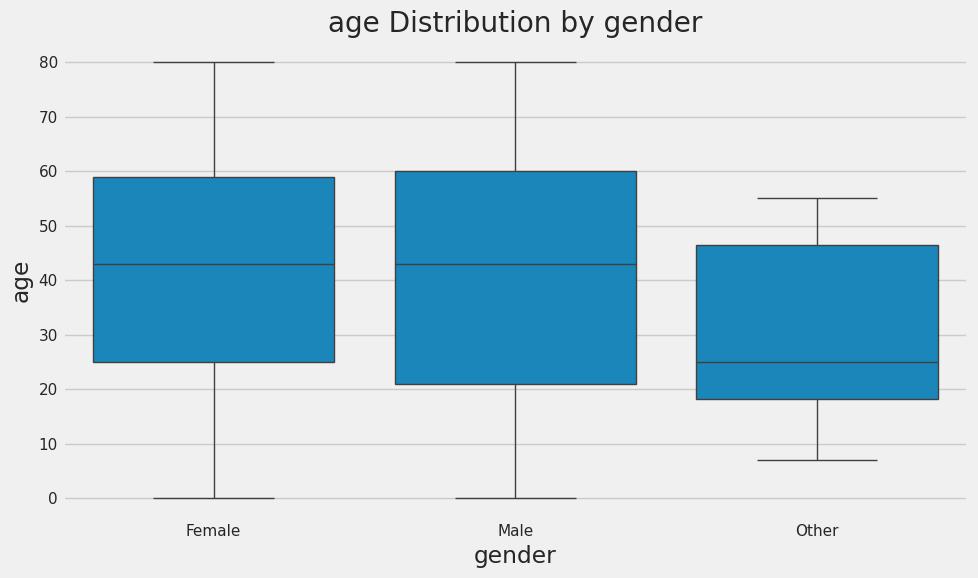

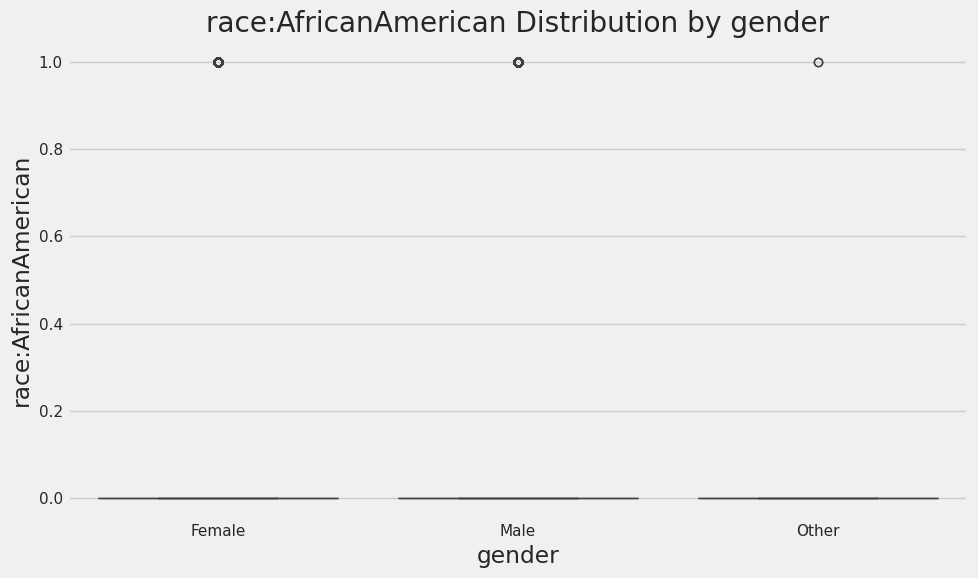

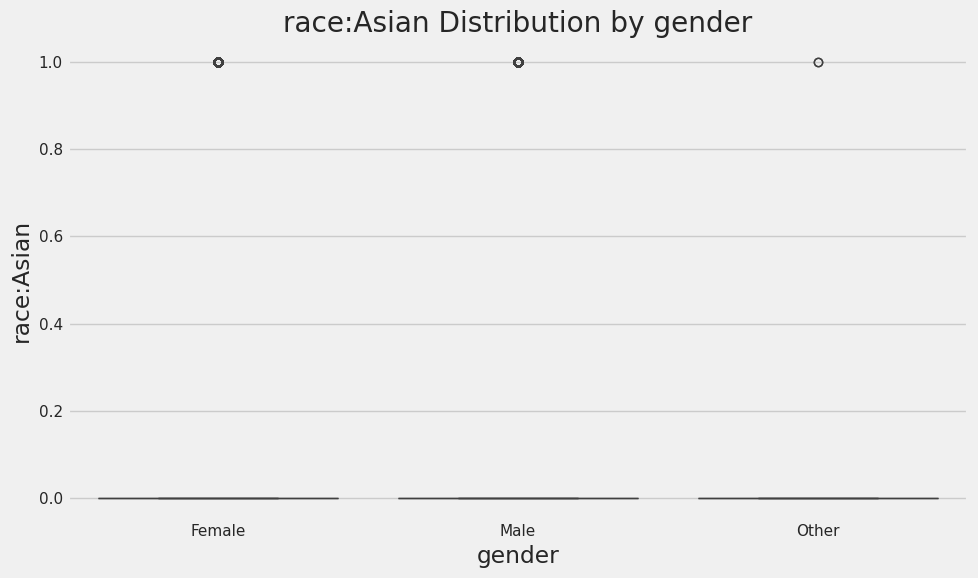

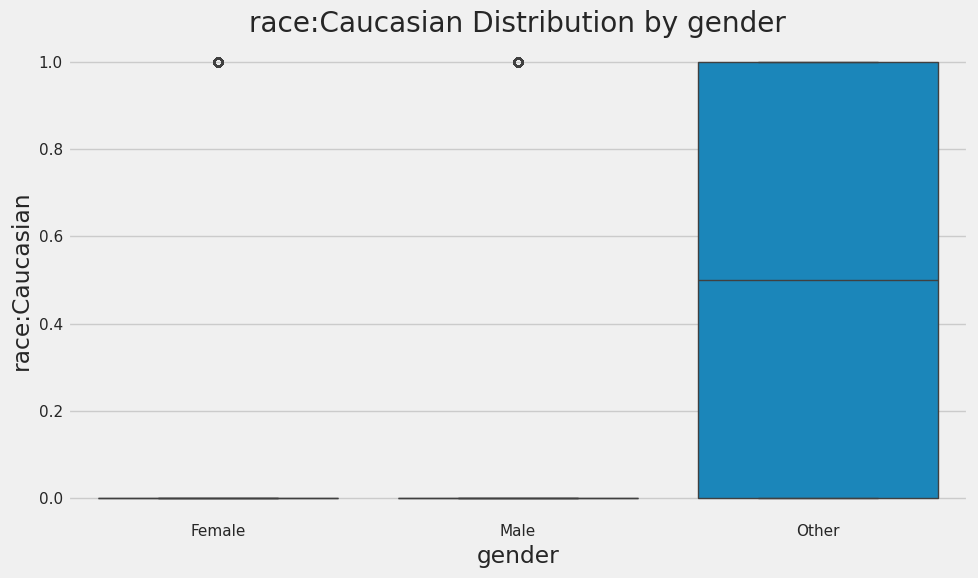

...

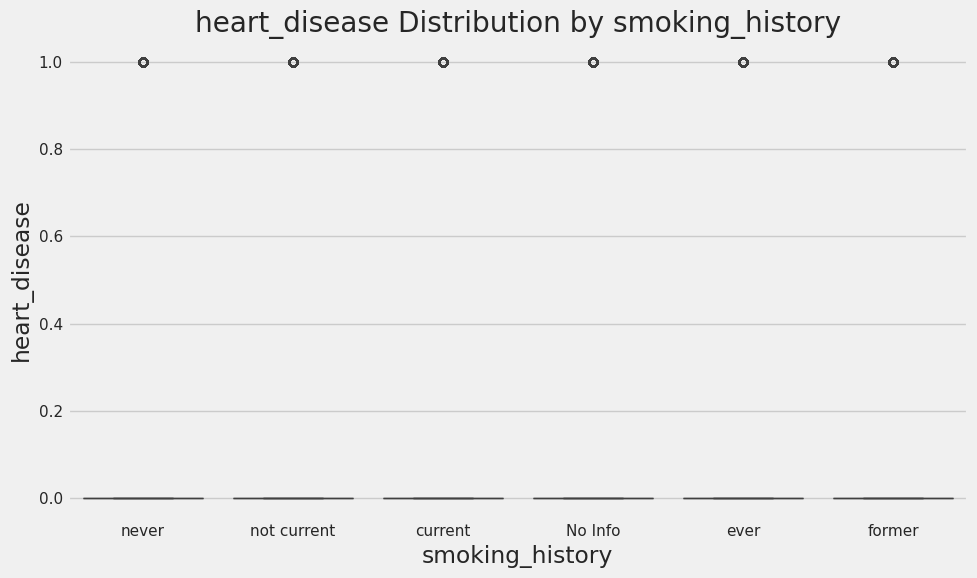

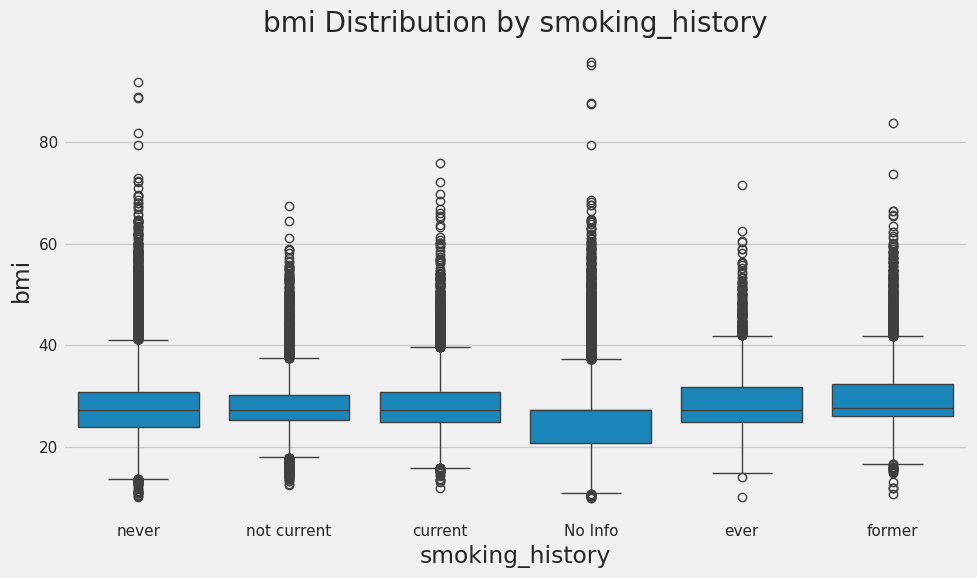

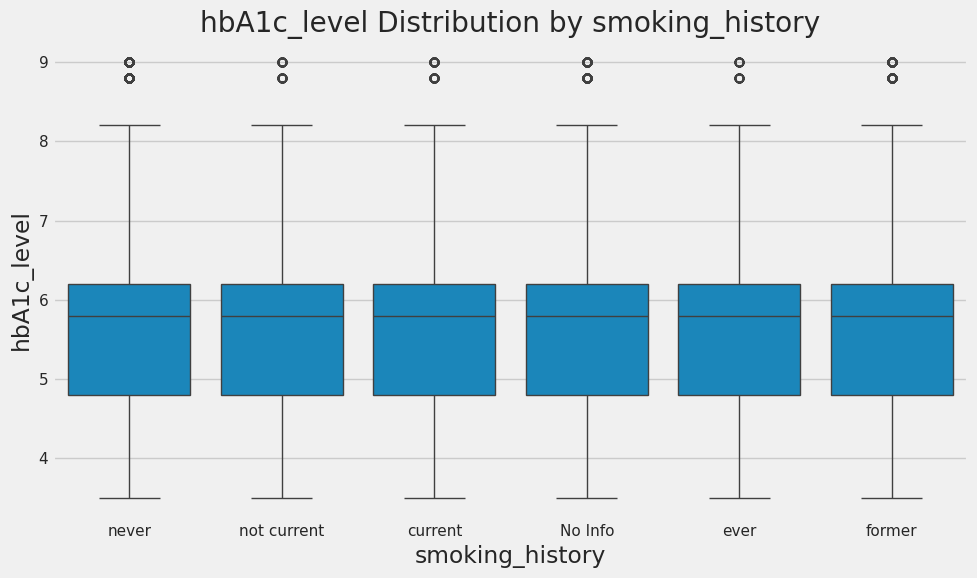

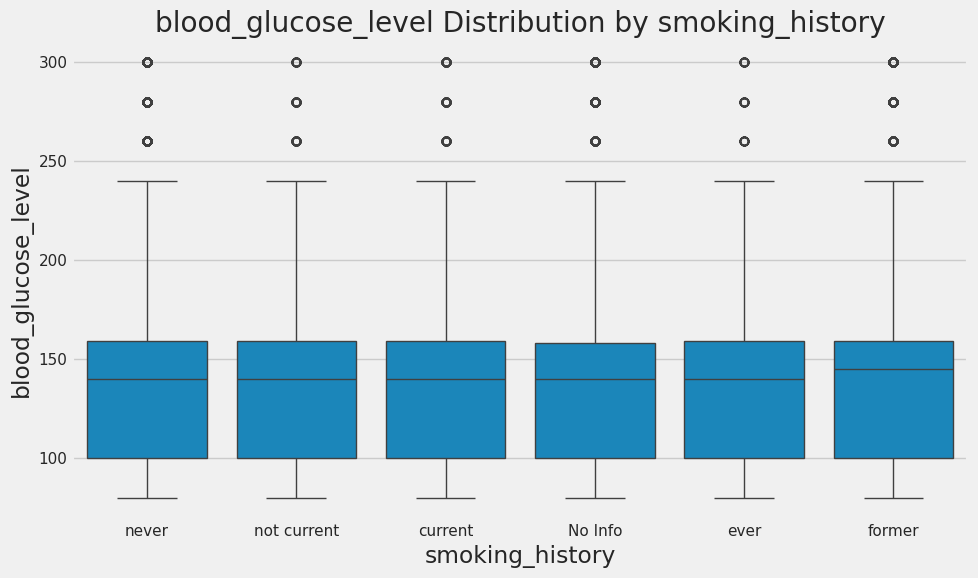

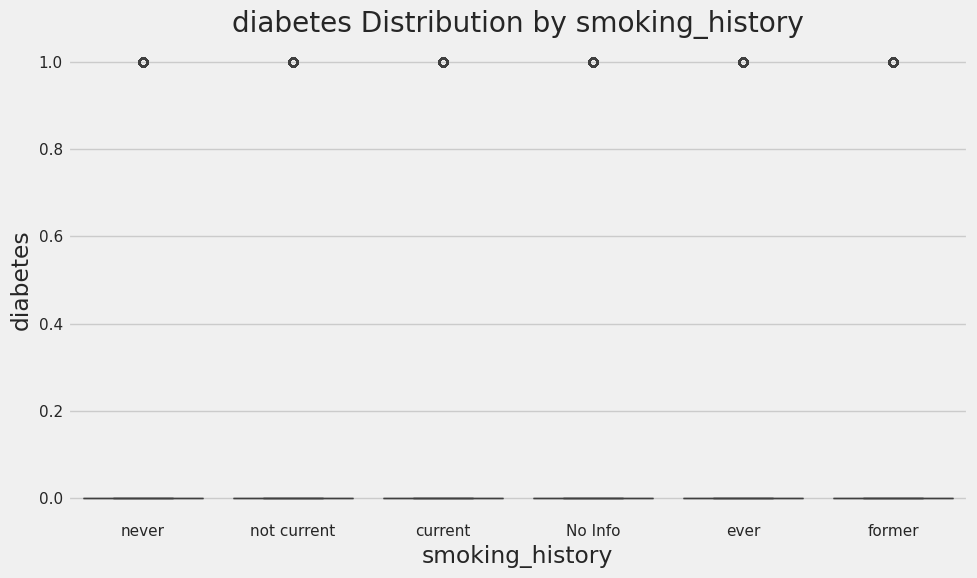

In [17]:
# Import libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Separate categorical and numeric columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
numeric_cols = df.select_dtypes(include=[np.number]).columns

# Plot each categorical variable against each numeric variable
for cat_col in categorical_cols:
    for num_col in numeric_cols:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=cat_col, y=num_col, data=df)
        plt.title(f'{num_col} Distribution by {cat_col}')
        plt.tight_layout()
        plt.show()


Scatter Plots for Numeric vs Numeric Variables
For numeric-numeric relationships, you can use scatter plots to visualize the relationships between different numeric features:

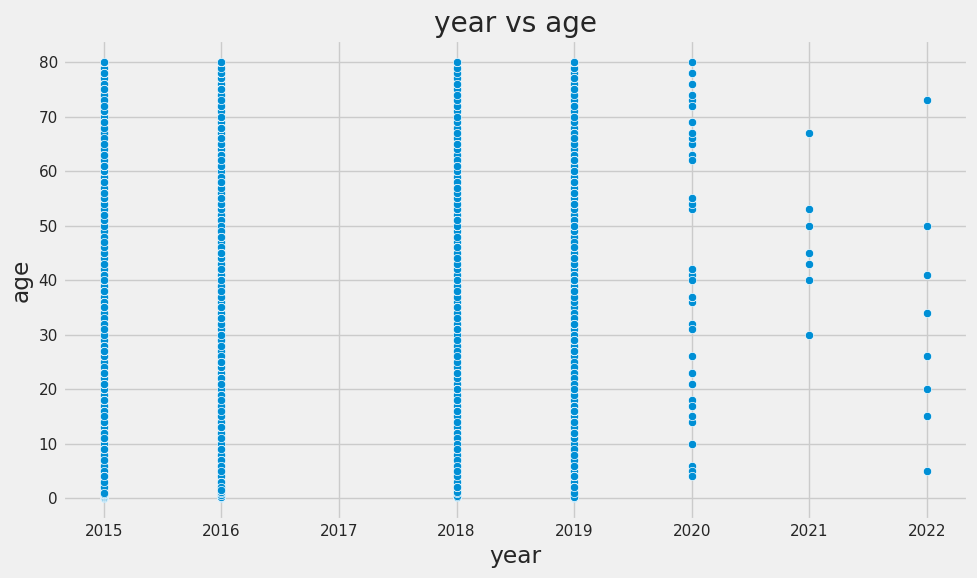

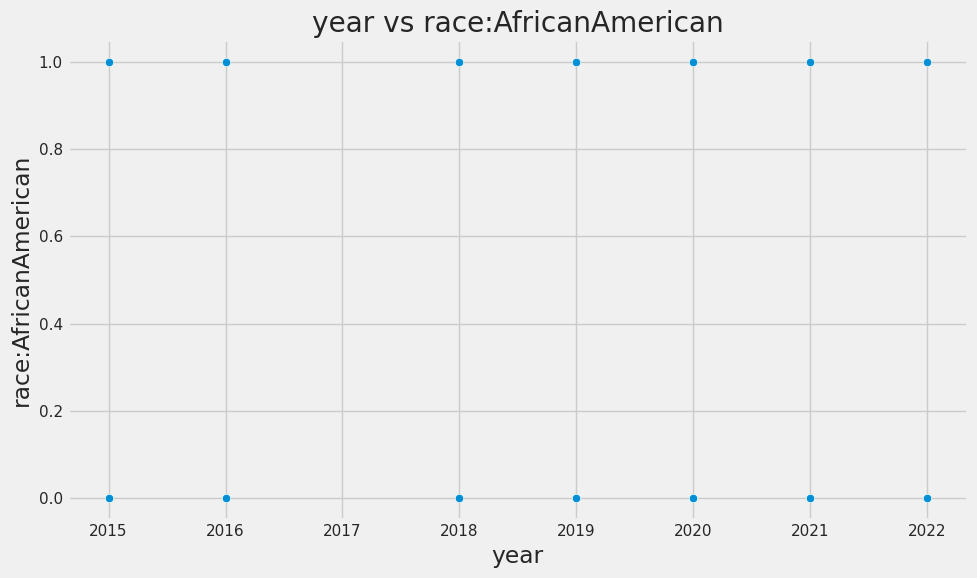

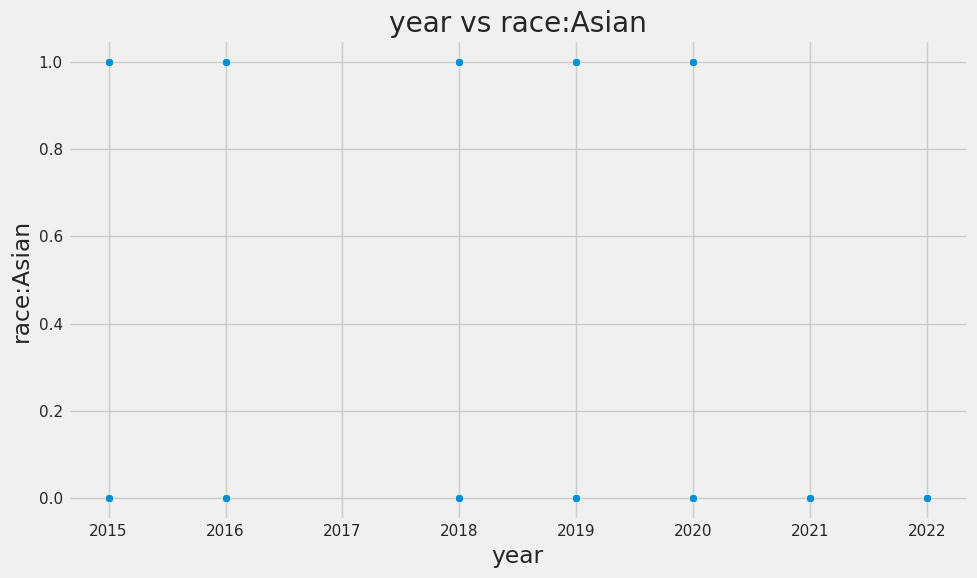

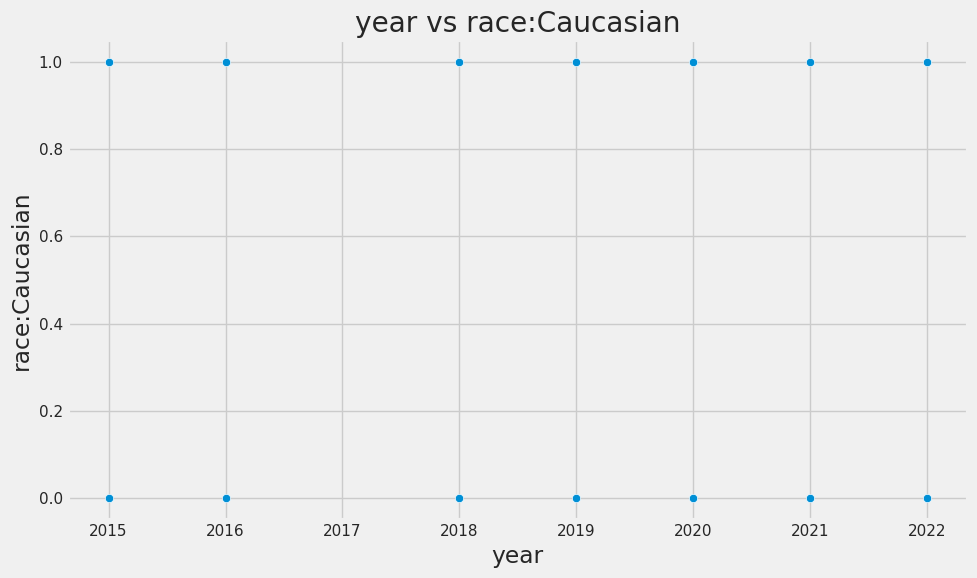

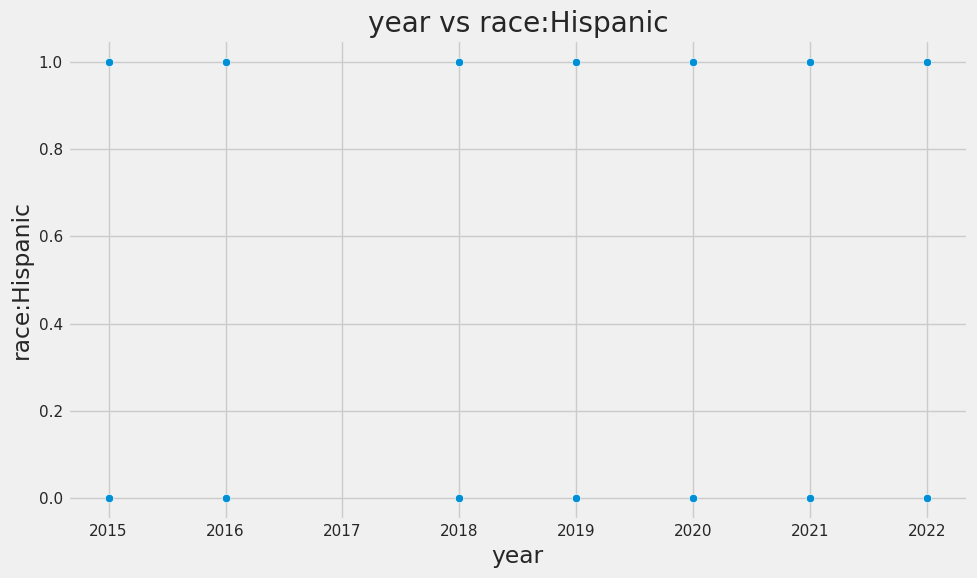

...

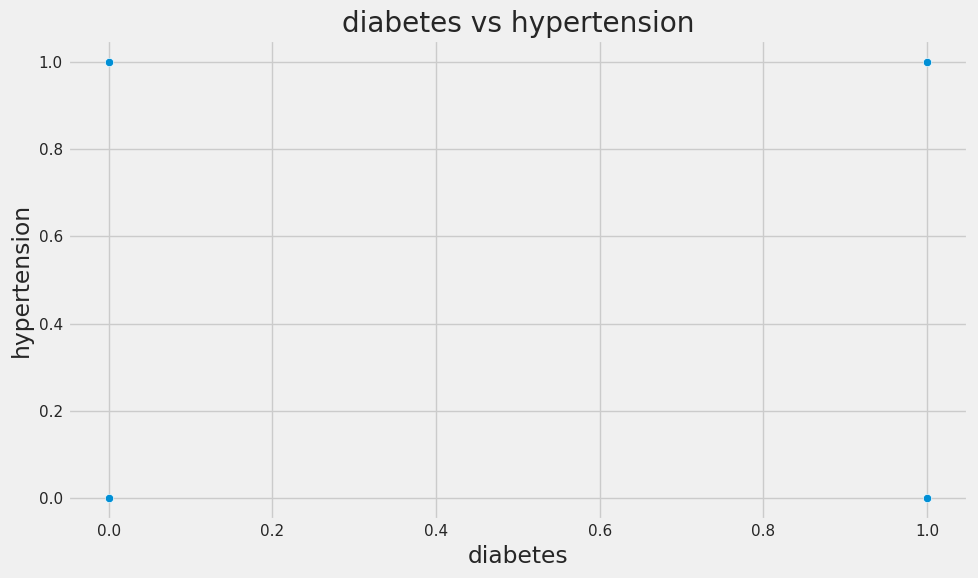

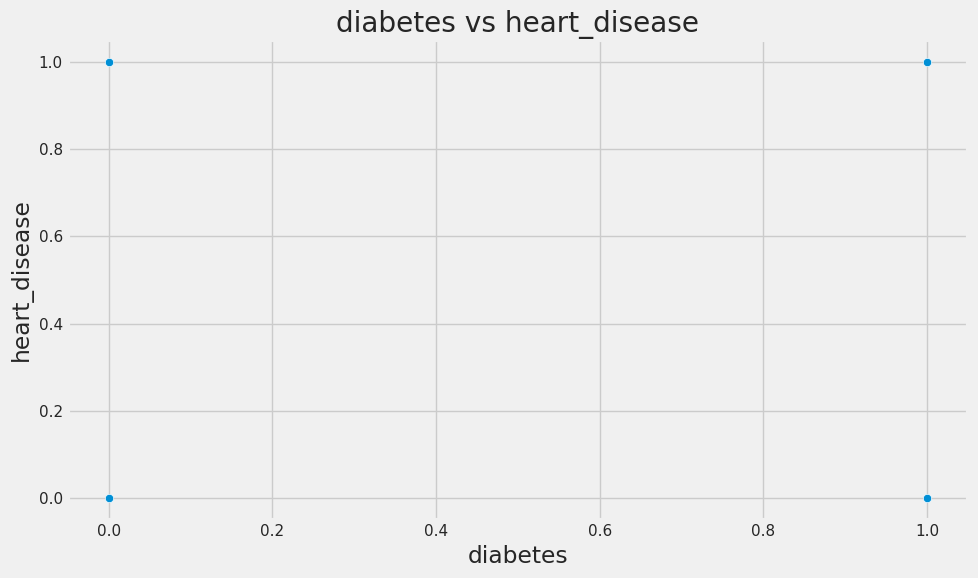

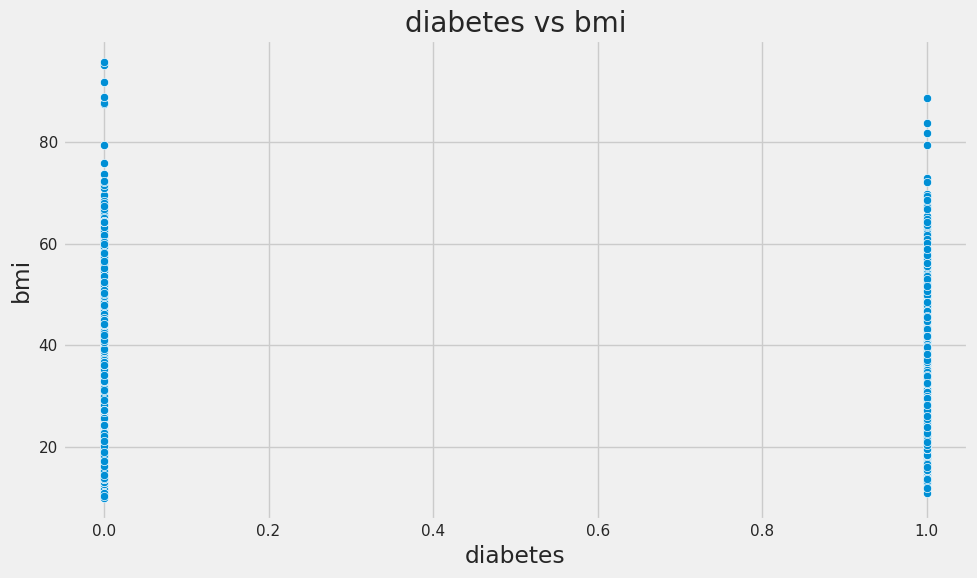

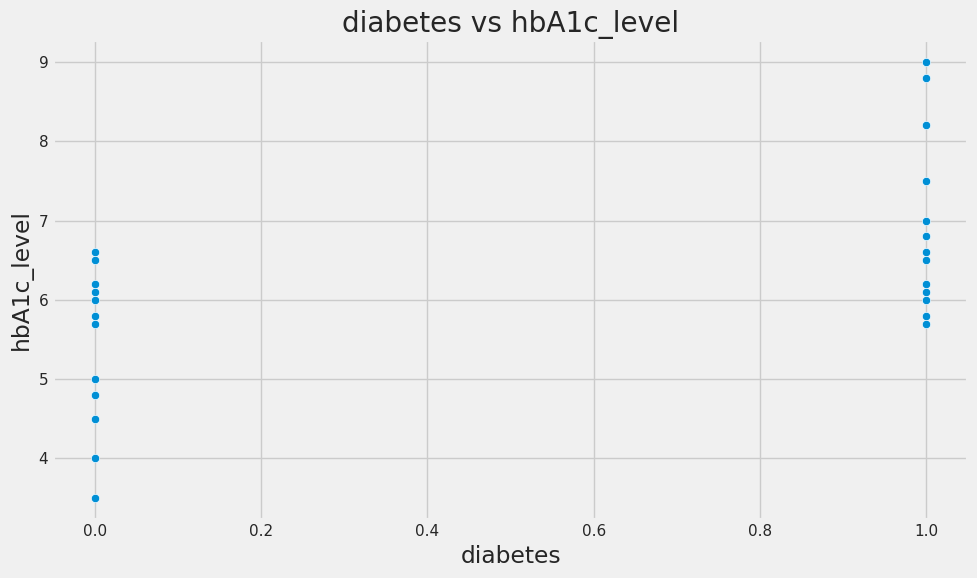

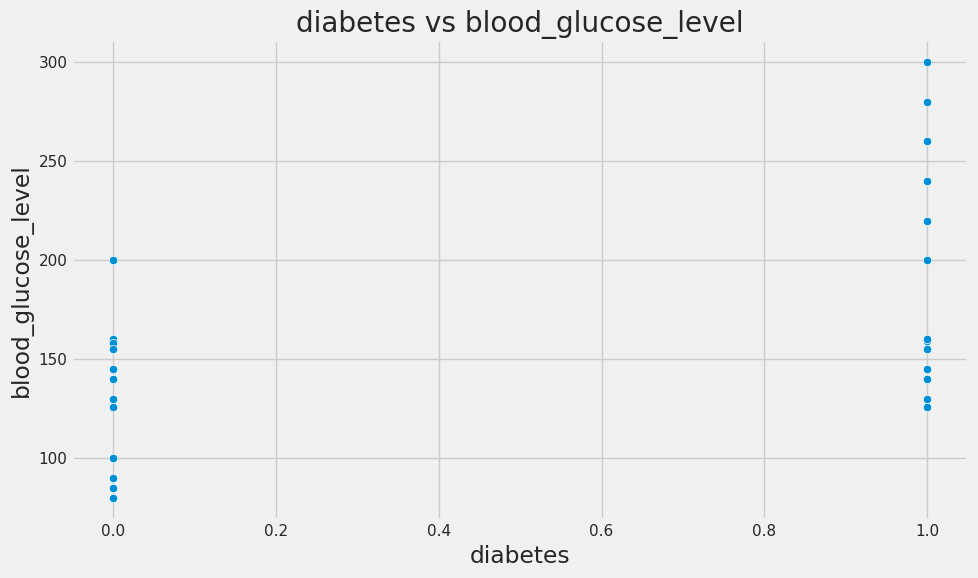

In [18]:
  # Plot each numeric variable against each other numeric variable
for num_col1 in numeric_cols:
    for num_col2 in numeric_cols:
        if num_col1 != num_col2:  # Avoid plotting the same variable against itself
            plt.figure(figsize=(10, 6))
            sns.scatterplot(x=num_col1, y=num_col2, data=df)
            plt.title(f'{num_col1} vs {num_col2}')
            plt.tight_layout()
            plt.show()


* Pairwise Plot for Numeric Variables
    * If you'd like a comprehensive visualization of relationships between all numeric variables, you can use pairplot to create a grid of scatter plots for each pair of numeric features:

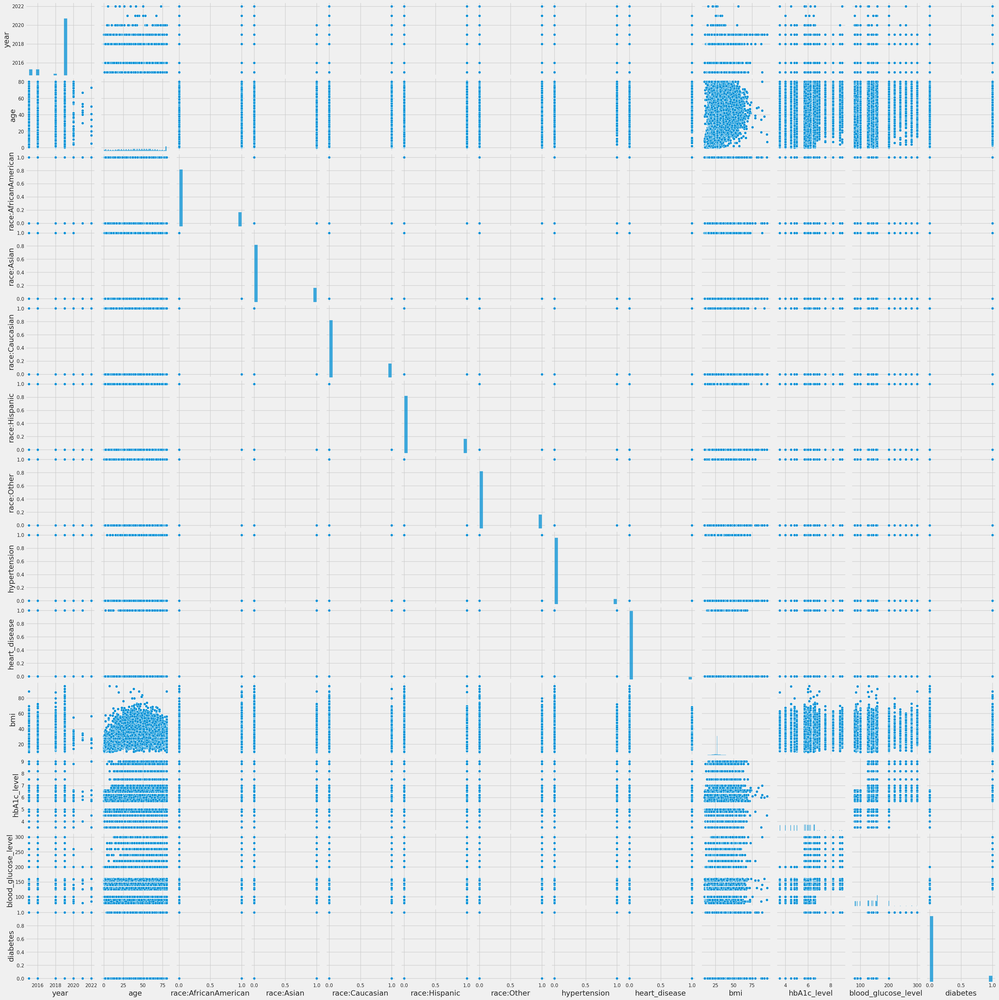

In [19]:
# Pairwise plot for all numeric variables
sns.pairplot(df[numeric_cols])
plt.show()


Checking for multicollinearity is an important step, especially when working with a large number of features, including one-hot encoded categorical variables. Multicollinearity occurs when two or more features are highly correlated, which can cause problems in some models (like linear regression), making the model coefficients unstable and difficult to interpret.

Why Multicollinearity Matters:
Redundancy: If two or more features are highly correlated, they might be carrying the same information. This can reduce model interpretability.
Instability: In models like linear regression, multicollinearity can make the model coefficients fluctuate dramatically with small changes in the data.
Not an issue for all models: Some models, such as tree-based models (like Random Forest), are not very sensitive to multicollinearity because they make splits based on the most useful feature at each step. However, it’s still a good practice to detect and handle it.
How to Detect Multicollinearity:
Variance Inflation Factor (VIF): VIF quantifies how much the variance of a regression coefficient is inflated due to multicollinearity. A VIF above 5-10 typically indicates high multicollinearity.

Correlation Matrix: We can check for any features that have high correlation (close to 1 or -1) with each other. However, this can miss more complex cases of multicollinearity that VIF would detect.

1. Using VIF to Detect Multicollinearity:
Let’s compute the Variance Inflation Factor (VIF) for the features in your dataset.

In [20]:
import pandas as pd
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Step 1: Apply one-hot encoding (if not already done)
df_encoded = pd.get_dummies(df, drop_first=True)

# Step 2: Ensure all data is numeric (convert any bool columns to int)
df_encoded = df_encoded.apply(lambda col: col.astype(int) if col.dtypes == 'bool' else col)

# Step 3: Define the feature matrix (X) without the target variable 'diabetes'
X = df_encoded.drop('diabetes', axis=1)

# Step 4: Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Step 5: Display VIF scores
print(vif_data.sort_values(by="VIF", ascending=False))


                 Feature            VIF
2   race:AfricanAmerican  473407.681002
3             race:Asian  468394.711532
6             race:Other  468188.049692
5          race:Hispanic  465597.660288
4         race:Caucasian  465276.973398
..                   ...            ...
11   blood_glucose_level       1.045505
10           hbA1c_level       1.042747
0                   year       1.039880
12           gender_Male       1.020650
13          gender_Other       1.001445

[73 rows x 2 columns]


In [21]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from scipy import stats

# -------- Phase 2: Data Preprocessing & Feature Engineering -------- #

# 1. Handle Missing Data (Imputation)
imputer = SimpleImputer(strategy='mean')
df['bmi'] = imputer.fit_transform(df[['bmi']])

# 2. Create New Features (Interaction Terms)
df['age_bmi_interaction'] = df['age'] * df['bmi']

# Print column names to verify
print("Columns in DataFrame:", df.columns)

# Check if the required columns exist before encoding
columns_to_encode = ['gender', 'location', 'smoking_history']
for col in columns_to_encode:
    if col not in df.columns:
        print(f"Column '{col}' not found in dataframe.")

# 3. One-Hot Encoding for Categorical Variables (Gender, Location, Smoking History)
encoder = OneHotEncoder(drop='first', sparse_output=False)  # Updated 'sparse_output' argument

# Ensure the columns are present before encoding
if all(col in df.columns for col in columns_to_encode):
    encoded_gender_location_smoking = encoder.fit_transform(df[columns_to_encode])
    encoded_df = pd.DataFrame(encoded_gender_location_smoking, columns=encoder.get_feature_names_out(columns_to_encode))

    # Concatenate encoded variables with the original dataframe
    df = pd.concat([df, encoded_df], axis=1)

    # Drop the original categorical columns only if they exist
    df = df.drop(columns=[col for col in columns_to_encode if col in df.columns])

else:
    print("Some columns are missing; cannot perform encoding.")


# 4. Scale Continuous Variables (bmi, hbA1c_level, blood_glucose_level)
scaler = StandardScaler()
df[['bmi', 'hbA1c_level', 'blood_glucose_level']] = scaler.fit_transform(df[['bmi', 'hbA1c_level', 'blood_glucose_level']])

# 5. Handle Outliers in BMI and Blood Glucose Levels using Z-score
z_scores = stats.zscore(df[['bmi', 'blood_glucose_level']])
df_no_outliers = df[(abs(z_scores) < 3).all(axis=1)]

# Displaying the final cleaned and preprocessed data
df_no_outliers.to_csv('cleaned_preprocessed_data.csv', index=False)

print("Data Preprocessing Completed. Cleaned data saved as 'cleaned_preprocessed_data.csv'")


Columns in DataFrame: Index(['year', 'gender', 'age', 'location', 'race:AfricanAmerican',
       'race:Asian', 'race:Caucasian', 'race:Hispanic', 'race:Other',
       'hypertension', 'heart_disease', 'smoking_history', 'bmi',
       'hbA1c_level', 'blood_glucose_level', 'diabetes',
       'age_bmi_interaction'],
      dtype='object')
Data Preprocessing Completed. Cleaned data saved as 'cleaned_preprocessed_data.csv'


In [22]:
import os
print(os.getcwd())  # This will print the current working directory


/content


In [23]:
import os
print(os.getcwd())  # This will print /content


/content


In [24]:
from google.colab import files
files.download('/content/cleaned_preprocessed_data.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [25]:
print(df.columns)  # This will show all column names in the dataframe


Index(['year', 'age', 'race:AfricanAmerican', 'race:Asian', 'race:Caucasian',
       'race:Hispanic', 'race:Other', 'hypertension', 'heart_disease', 'bmi',
       'hbA1c_level', 'blood_glucose_level', 'diabetes', 'age_bmi_interaction',
       'gender_Male', 'gender_Other', 'location_Alaska', 'location_Arizona',
       'location_Arkansas', 'location_California', 'location_Colorado',
       'location_Connecticut', 'location_Delaware',
       'location_District of Columbia', 'location_Florida', 'location_Georgia',
       'location_Guam', 'location_Hawaii', 'location_Idaho',
       'location_Illinois', 'location_Indiana', 'location_Iowa',
       'location_Kansas', 'location_Kentucky', 'location_Louisiana',
       'location_Maine', 'location_Maryland', 'location_Massachusetts',
       'location_Michigan', 'location_Minnesota', 'location_Mississippi',
       'location_Missouri', 'location_Montana', 'location_Nebraska',
       'location_Nevada', 'location_New Hampshire', 'location_New Jersey'

In [26]:
# Group Locations into Broader Regions:

# Define groups of states for each region
east_states = ['location_New York', 'location_Massachusetts', 'location_New Jersey', 'location_Pennsylvania']
west_states = ['location_California', 'location_Washington', 'location_Oregon']
south_states = ['location_Texas', 'location_Florida', 'location_Georgia']
north_states = ['location_Illinois', 'location_Michigan', 'location_Wisconsin']

# Create a new column for each region by summing the corresponding one-hot encoded columns
df['region_east'] = df[east_states].sum(axis=1)
df['region_west'] = df[west_states].sum(axis=1)
df['region_south'] = df[south_states].sum(axis=1)
df['region_north'] = df[north_states].sum(axis=1)

# Optionally drop the individual one-hot encoded location columns
df = df.drop(columns=east_states + west_states + south_states + north_states)


In [27]:
# Frequency Encoding for Locations:

# Get the frequency of each one-hot encoded location column (sum of 1s in each column)
location_columns = [col for col in df.columns if col.startswith('location_')]
freq_encoded = {col: df[col].sum() for col in location_columns}

# Create a new column 'location_encoded' that applies the frequency to each row
df['location_encoded'] = df[location_columns].dot(pd.Series(freq_encoded))

# Optionally drop the individual one-hot encoded location columns
df = df.drop(columns=location_columns)


In [28]:
print(df['location_encoded'].head())  # Check a few rows of the new column


0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: location_encoded, dtype: float64


In [29]:
print(df.isnull().sum())  # Check for any missing values


year                           14
age                            14
race:AfricanAmerican           14
race:Asian                     14
race:Caucasian                 14
race:Hispanic                  14
race:Other                     14
hypertension                   14
heart_disease                  14
bmi                            14
hbA1c_level                    14
blood_glucose_level            14
diabetes                       14
age_bmi_interaction            14
gender_Male                    14
gender_Other                   14
smoking_history_current        14
smoking_history_ever           14
smoking_history_former         14
smoking_history_never          14
smoking_history_not current    14
region_east                     0
region_west                     0
region_south                    0
region_north                    0
location_encoded               14
dtype: int64


#### There are no missing values. So, let's proceed.

* Since there are no missing values, and you have already encoded your location data into broader regions (region_east, region_west, region_south, region_north) and applied frequency encoding (location_encoded), you can now finalize the preprocessed dataset.

* Check Data Distributions: Visualize the key features in your dataset to ensure everything looks correct and consistent.

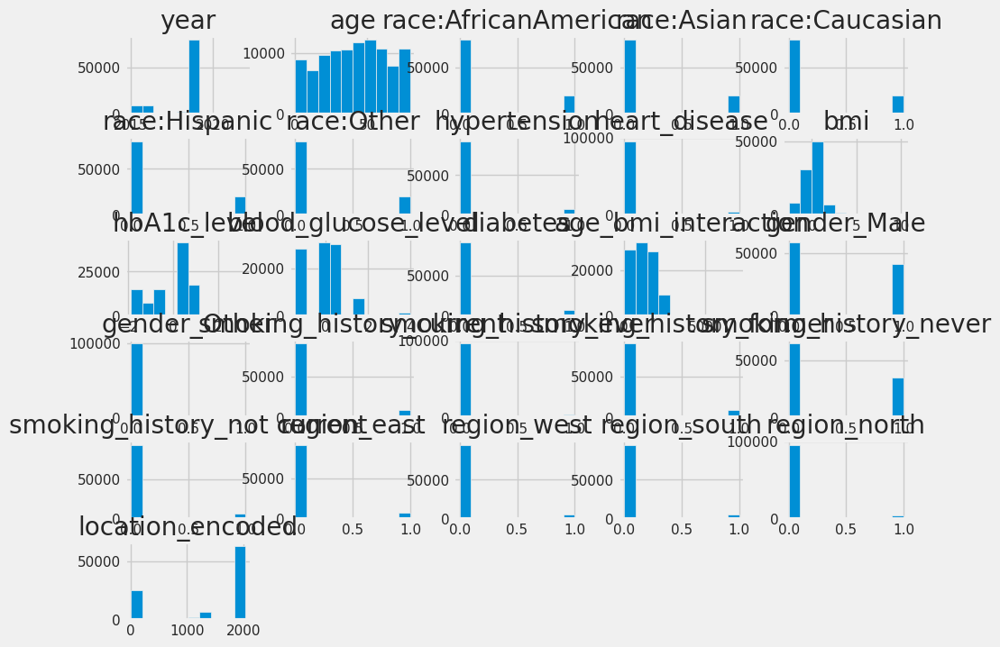

In [30]:
import matplotlib.pyplot as plt
df.hist(figsize=(10, 8))
plt.show()  # Check distributions of all numeric features


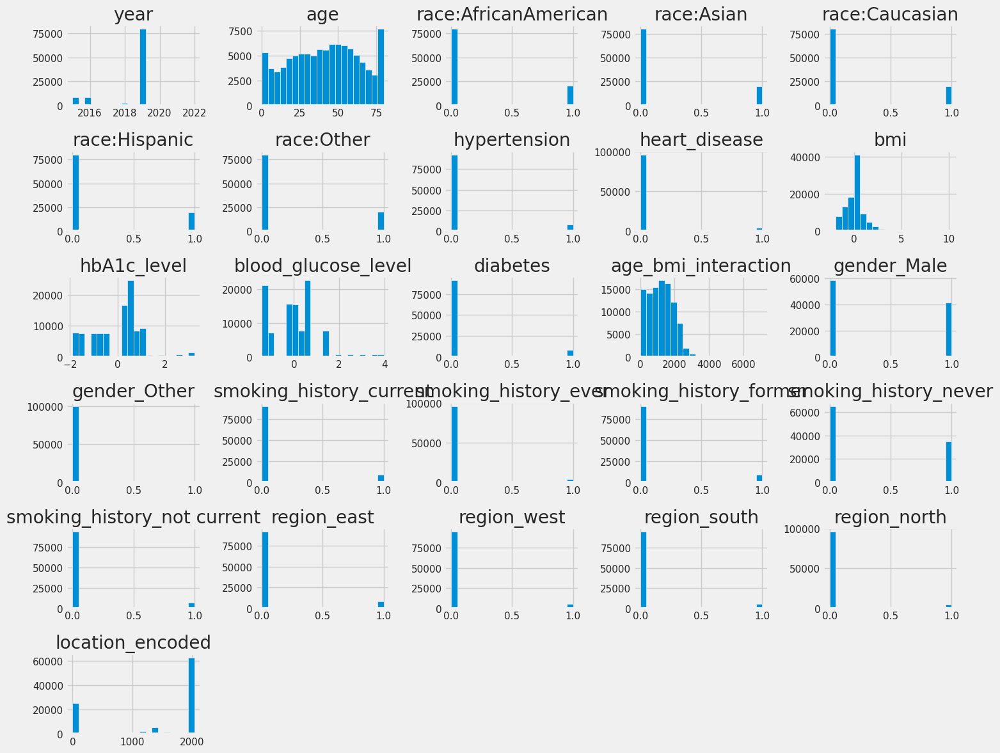

In [31]:
import matplotlib.pyplot as plt

# Plot histograms with adjusted figure size and layout
df.hist(figsize=(15, 12), bins=20)
plt.tight_layout()  # Adjusts the layout so labels and plots don't overlap
plt.show()


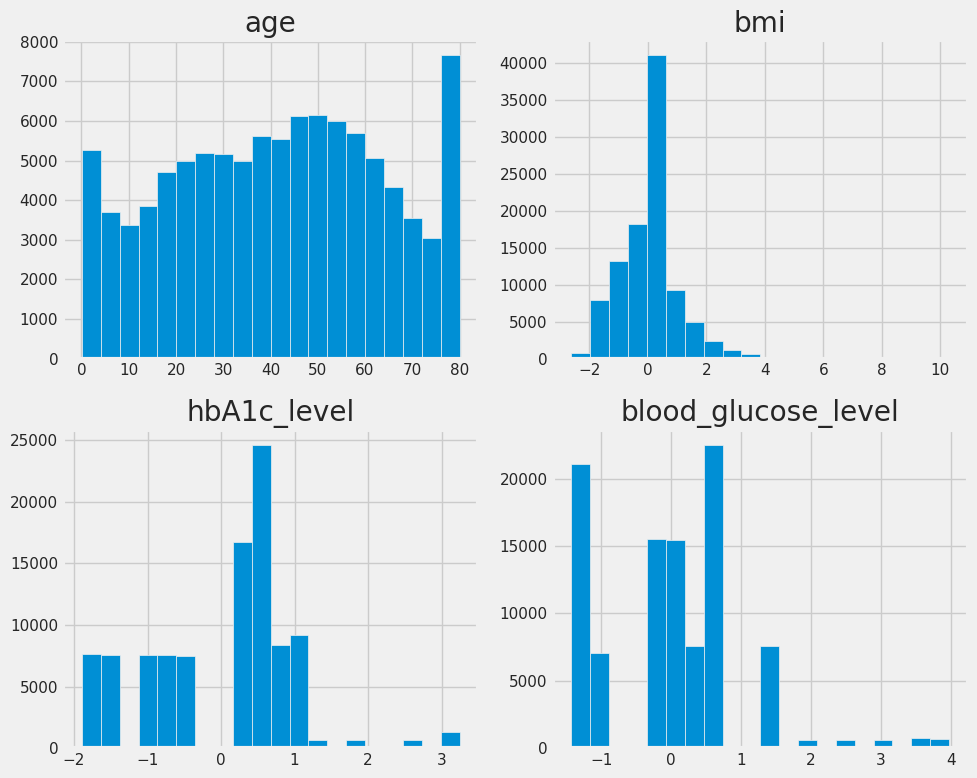

In [32]:
# Plot Specific Columns:
# continuous variables like age, bmi, hbA1c_level), you can plot only those columns to reduce clutter.

# Plot specific continuous variables
df[['age', 'bmi', 'hbA1c_level', 'blood_glucose_level']].hist(figsize=(10, 8), bins=20)
plt.tight_layout()
plt.show()


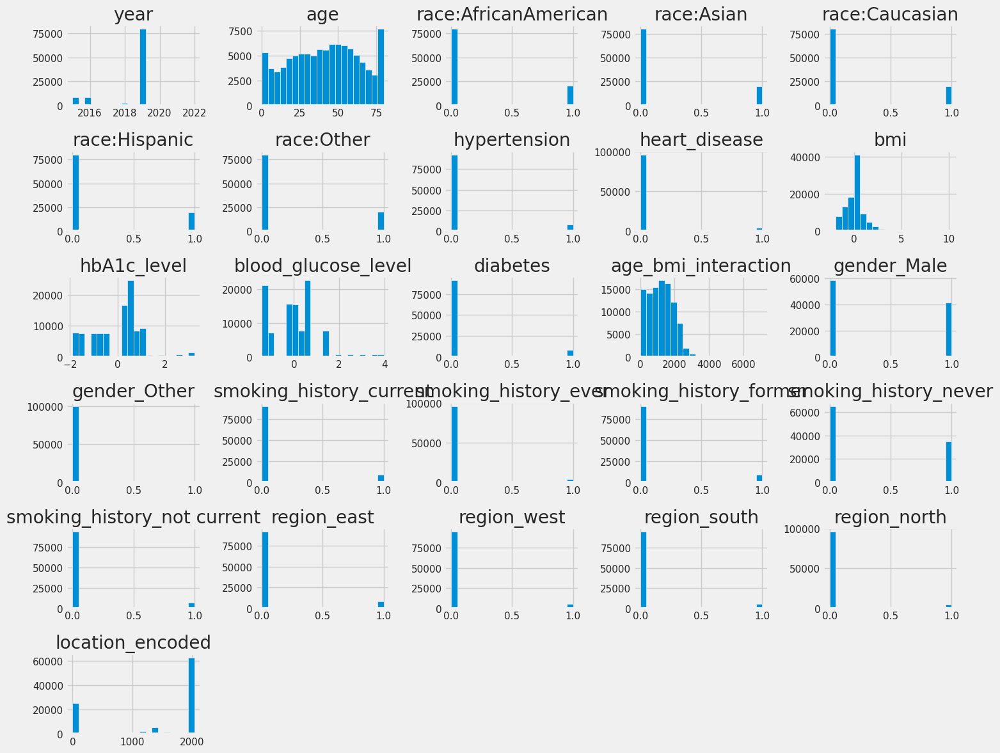

In [33]:
# Rotate X-Axis Labels:
# Rotate x-axis labels
df.hist(figsize=(15, 12), bins=20)
plt.xticks(rotation=45)  # Rotate x-axis labels
plt.tight_layout()
plt.show()


### Feature Scaling:
* Before we move on to model training, let's ensure that the continuous variables are scaled. We have scaled bmi, hbA1c_level, and blood_glucose_level, but we may also want to scale new features like location_encoded and any others that were added.

In [34]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

# List of continuous variables to scale
features_to_scale = ['bmi', 'hbA1c_level', 'blood_glucose_level', 'location_encoded',
                     'age_bmi_interaction']

# Apply scaling
df[features_to_scale] = scaler.fit_transform(df[features_to_scale])

# Check the scaled data
print(df[features_to_scale].head())


        bmi  hbA1c_level  blood_glucose_level  location_encoded  \
0 -0.000116    -0.492699            -0.934929         -1.638365   
1 -1.110521    -0.492699            -1.180578         -1.638365   
2 -0.536485    -0.679498             0.538966         -1.638365   
3 -0.000116    -1.426695             0.514401         -1.638365   
4 -0.537992     0.908296            -1.180578         -1.638365   

   age_bmi_interaction  
0            -0.450018  
1            -0.865145  
2            -1.076956  
3            -0.104821  
4             0.056462  


### Train-Test Split:

In [35]:
from sklearn.model_selection import train_test_split

# Define X (features) and y (target)
X = df.drop(columns=['diabetes'])  # Features, excluding the target
y = df['diabetes']  # Target

# Split into train and test sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Check the sizes of training and testing sets
print(f"Training set size: {X_train.shape}")
print(f"Test set size: {X_test.shape}")


Training set size: (80000, 25)
Test set size: (20000, 25)


In [38]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

# Split the data into training and testing sets (80% training, 20% testing)
#X = df.drop(columns=['diabetes'])  # Features, excluding the target
#y = df['diabetes']  # Target

# Create an imputer for numeric features
imputer = SimpleImputer(strategy='mean')  # You can choose 'median', 'most_frequent', etc.
X = imputer.fit_transform(df.drop(columns=['diabetes']))

# Target variable (y) handling, if it has NaNs
y = df['diabetes'].fillna(df['diabetes'].mode()[0])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the Logistic Regression model
model = LogisticRegression(random_state=42)
model.fit(X_train, y_train)

# Model accuracy
accuracy = model.score(X_test, y_test)
print(f"Logistic Regression Accuracy: {accuracy}")


Logistic Regression Accuracy: 0.95995


In [39]:
from sklearn.ensemble import RandomForestClassifier

# Train the Random Forest model
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

# Model accuracy
rf_accuracy = rf_model.score(X_test, y_test)
print(f"Random Forest Accuracy: {rf_accuracy}")


Random Forest Accuracy: 0.97155


### Model Evaluation: using classification metrics such as accuracy, precision, recall, F1-score, and confusion matrix.

In [40]:
from sklearn.metrics import classification_report, confusion_matrix

# Get predictions
y_pred = rf_model.predict(X_test)

# Classification report
print(classification_report(y_test, y_pred))

# Confusion matrix
print(confusion_matrix(y_test, y_pred))


              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98     18296
         1.0       0.99      0.67      0.80      1704

    accuracy                           0.97     20000
   macro avg       0.98      0.84      0.89     20000
weighted avg       0.97      0.97      0.97     20000

[[18286    10]
 [  559  1145]]


### Performance Insights:
* Accuracy:
  * The model is correctly predicting the outcome in 97% of the cases, which is quite high.
* Precision:
  * Precision for class 1 (diabetes) is 0.99, indicating that when the model predicts someone has diabetes, it's correct 99% of the time.
* Recall:
  * The recall for class 1 is 0.67, meaning the model is able to identify 67% of the actual diabetic cases. This indicates that while the precision is very high, the model may be missing some diabetic cases (false negatives).
* F1-Score:
  * The F1-score for class 1 is 0.80, showing a decent balance between precision and recall for identifying diabetes. However, there’s room to improve recall, especially for class 1.
* Confusion Matrix:
  * True Positives (TP): 1,145 diabetic cases were correctly identified.
  * False Negatives (FN): 559 diabetic cases were missed.
  * True Negatives (TN): 18,286 non-diabetic cases were correctly identified.
  * False Positives (FP): Only 10 cases were wrongly identified as diabetic.


### mprove Recall for Class 1: The recall for detecting diabetic cases (class 1) could be improved with the following:

* Class Imbalance Handling: It looks like there is a class imbalance (with far more non-diabetic cases than diabetic cases). You can try upsampling or downsampling or use techniques like SMOTE (Synthetic Minority Over-sampling Technique).
* Adjust Class Weights: In the RandomForestClassifier, you can adjust the class_weight parameter to put more emphasis on the minority class (1). This can help the model focus on detecting diabetic cases.

In [41]:
rf_model = RandomForestClassifier(random_state=42, class_weight='balanced')
rf_model.fit(X_train, y_train)


RandomForestClassifier(class_weight='balanced', random_state=42)

### Experimenting with Other Models
* Gradient Boosting: We'll train a GradientBoostingClassifier and check the results.

In [42]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Train Gradient Boosting model
gb_model = GradientBoostingClassifier(random_state=42)
gb_model.fit(X_train, y_train)

# Predictions and evaluation
y_pred_gb = gb_model.predict(X_test)

# Print classification report and confusion matrix
print("Gradient Boosting Classification Report:")
print(classification_report(y_test, y_pred_gb))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_gb))


Gradient Boosting Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98     18296
         1.0       0.99      0.67      0.80      1704

    accuracy                           0.97     20000
   macro avg       0.98      0.84      0.89     20000
weighted avg       0.97      0.97      0.97     20000

Confusion Matrix:
[[18282    14]
 [  557  1147]]


### XGBoost:
* Similarly, we'll train an XGBoost model and evaluate its performance.



In [43]:
from xgboost import XGBClassifier

# Train XGBoost model
xgb_model = XGBClassifier(random_state=42)
xgb_model.fit(X_train, y_train)

# Predictions and evaluation
y_pred_xgb = xgb_model.predict(X_test)

# Print classification report and confusion matrix
print("XGBoost Classification Report:")
print(classification_report(y_test, y_pred_xgb))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_xgb))


XGBoost Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98     18296
         1.0       0.96      0.69      0.81      1704

    accuracy                           0.97     20000
   macro avg       0.97      0.84      0.90     20000
weighted avg       0.97      0.97      0.97     20000

Confusion Matrix:
[[18250    46]
 [  524  1180]]


### Hyperparameter Tuning with GridSearchCV for Random Forest:
* Next, let's apply GridSearchCV for hyperparameter tuning of the Random Forest model. We’ll search over parameters like n_estimators, max_depth, and min_samples_split.

In [44]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 150],  # Fewer values for faster training
    'max_depth': [None, 10],     # Keep fewer options for depth
    'min_samples_split': [2, 5]  # Minimal number of splits
}

# Initialize the model
rf_model = RandomForestClassifier(random_state=42)

# Set up GridSearchCV
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)

# Fit GridSearchCV to find the best parameters
grid_search.fit(X_train, y_train)

# Best parameters and model
print(f"Best Parameters: {grid_search.best_params_}")
best_rf_model = grid_search.best_estimator_

# Predictions and evaluation
y_pred_rf = best_rf_model.predict(X_test)

# Print classification report and confusion matrix
print("Tuned Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf))


Fitting 3 folds for each of 8 candidates, totalling 24 fits
Best Parameters: {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 150}
Tuned Random Forest Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98     18296
         1.0       0.99      0.67      0.80      1704

    accuracy                           0.97     20000
   macro avg       0.98      0.84      0.89     20000
weighted avg       0.97      0.97      0.97     20000

Confusion Matrix:
[[18290     6]
 [  559  1145]]


In [45]:
import pickle

# Save the model to a file (for example, Random Forest model)
with open('best_rf_model.pkl', 'wb') as file:
    pickle.dump(best_rf_model, file)


In [54]:
from google.colab import files

# Download the pickle file
files.download('best_rf_model.pkl')

# Or, if using joblib
# files.download('best_rf_model.joblib')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>